# Introduction

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [1]:
cfg_file='sample_60_rfboard.yml' # Configuration file name
expt_path = 'C:\\_Data\\sample_68_2\\' # Experiment data path

max_t1 = 5 # Maximum T1 to consider when doing experiments (in us)

## Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

np.set_printoptions(legacy="1.25")
from qick import QickConfig

from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, measure_func
from slab_qick_calib.calib.time_tracking import time_tracking
from slab_qick_calib.analysis import qubit_params 
from slab_qick_calib.helpers import rfboard, qick_check, config, handy

%load_ext autoreload
%autoreload 2

# Set color palette and font size
handy.config_figs()

<module 'slab_qick_calib.experiments' from 'C:\\_Lib\\python\\qq\\slab_qick_calib\\experiments\\__init__.py'>
C:\_Lib\python\qq\slab_qick_calib\experiments
imported slab_qick_calib.experiments.general.qick_experiment
imported slab_qick_calib.experiments.general.qick_experiment_2q
imported slab_qick_calib.experiments.general.qick_program
C:\_Lib\python\qq\slab_qick_calib\experiments\general
C:\_Lib\python\qq\slab_qick_calib\experiments\single_qubit
imported slab_qick_calib.experiments.single_qubit.active_reset
imported slab_qick_calib.experiments.single_qubit.power_calibration
imported slab_qick_calib.experiments.single_qubit.pulse_probe_spectroscopy
imported slab_qick_calib.experiments.single_qubit.rabi
imported slab_qick_calib.experiments.single_qubit.resonator_spectroscopy
imported slab_qick_calib.experiments.single_qubit.single_shot
imported slab_qick_calib.experiments.single_qubit.single_shot_opt
imported slab_qick_calib.experiments.single_qubit.stark_spectroscopy
imported slab_qic

In [3]:
import qick
qick.__version__

'0.2.360'

## Set up new config 
Set to variables to True when setting up a new experiment config file. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_manual.md

In [4]:
# Set to false if you aren't creating a new one
new_config = True
new_folder = True

nqubits = 4
rfsoc_alias = 'bf1_soc'
t1_guess = 50 
ip = '10.108.30.23' # ip address of name server that rfsoc is connected to 
import os

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:
    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess, ip=ip)
        config.init_model_config(cfg_file_path, nqubits)


    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\sample_68_2\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

If you need to restart the RFSoC, you should reconnect it to the nameserver and rerun this. 

In [5]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=auto_cfg['aliases']['ip'])
print(im)

soc = im[auto_cfg['aliases']['soc']]
soccfg = QickConfig(soc.get_cfg())

cfg_dict = {'soc': soccfg, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

{'Pyro.NameServer': <Pyro4.core.Proxy at 0x231cebb6fc0; not connected; for PYRO:Pyro.NameServer@10.108.30.23:9090>, 'bf1_soc': <Pyro4.core.Proxy at 0x231ce974170; not connected; for PYRO:obj_4403763ebf6641d289a71a6950f9a961@10.108.30.74:38793>}


In [10]:
print(soccfg)
# ADC 0 /1, 4, 5 
# DAC 0 / 1/ 2 /3  

QICK running on ZCU216, software version 0.2.360

Firmware configuration (built Sun Jun 15 22:25:25 2025):

	Global clocks (MHz): tProc dispatcher timing 430.080, RF reference 245.760
	Groups of related clocks: [tProc core clock, tProc timing clock, DAC tile 1, DAC tile 2, DAC tile 3], [DAC tile 0], [ADC tile 1, ADC tile 2]

	16 signal generator channels:
	0:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 65536 complex samples (6.838 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 0 is 0_228 on JHC1, or QICK box DAC port 0
	1:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 16384 complex samples (1.709 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 1 is 1_228 on JHC2, or QICK box DAC port 1
	2:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 32768 complex samples (3.419 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 2 is 2_228 on JHC1, or QICK box DAC port 2
	3:	axis_signal_ge

## Check QICK issues

### Check mirror frequencies on qubit

In [ ]:
qick_check.check_freqs(0, cfg_dict)

Nyquist frequency: 4792.32 MHz
Possible g-e frequencies: 5663.3785 MHz and 3921.2614999999996 MHz
Possible e-f frequencies: 5616.9564 MHz and 3967.6835999999994 MHz
Anharmonicity: 46.42209999999977 MHz. With aliased e-f: 1695.6949000000004 MHz
Both e-f frequencies are less than the chosen g-e frequency and greater than the aliased g-e frequency.
Recommendation: Current g-e frequency is the correct choice.


### Check mirror frequencies from resonators

In [ ]:
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4792.32 MHz
Configured resonator frequencies (MHz):
3939.186 7145.179 7675.587 8289.873
Aliased resonator frequencies (MHz):
5645.454 2439.461 1909.053 1294.767
Qubit frequencies (MHz):
5663.378 4540.62 3396.334 2558.607
Difference between mirror resonator and qubit frequencies (MHz):
17.9243 2101.158 1487.281 1263.84


### Check sampling rates and minimum point spacing

In [ ]:
fnyq = cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
clock_tick = 1e3*cfg_dict['soc'].cycles2us(1)
print(f'ADC Nyquist frequency is {fnyq} MHz')
print(f'1 clock tick is {clock_tick} ns')

soccfg.cycles2us(1)*1e3

ADC Nyquist frequency is 1228.8 MHz
1 clock tick is 2.3251488095238093 ns


2.3251488095238093

### Make sure you're not near the nyquist frequency of the ADC

In [ ]:
qick_check.check_adc(cfg_dict)

ADC sampling frequency: 2457.6


In [ ]:
cfg_dict['soc']

# RF Board Setup
Filters and attenuators are configured using the `rfboard` helper module.
Per-qubit settings are stored in the config file.

In [ ]:
# Bypass all on-board filters (clean start)
#rfboard.bypass_all_filters(soc, gen_channels=[0, 1], ro_channels=[0], cfg=auto_cfg)

In [ ]:
# Apply per-qubit RF settings from config (filters + attenuators)
rfboard.apply_config_rf_settings(soc, auto_cfg, cfg_file=cfg_path)

In [ ]:
print("read bias:", soc.rfb_get_bias(0))
print("set bias:", soc.rfb_set_bias(0,0.1))
print("read bias:", soc.rfb_get_bias(0))

In [ ]:
soc.rfb_set_bias(3, float(0))

In [ ]:
channel = 3
step = 0.02
max_val = 0.08
num_steps = int(max_val / step)
range = __builtins__.range
import time
for i in range(num_steps + 1):
    current = max_val - i * step
    print(f"--- {current:.1f}V ---")
    print("read bias:", soc.rfb_get_bias(channel))
    print("set bias:", soc.rfb_set_bias(channel, current))
    print("read bias:", soc.rfb_get_bias(channel))
    time.sleep(1)

In [7]:
cfg_dict

{'soc': <qick.qick_asm.QickConfig at 0x231c19fc380>,
 'expt_path': 'C:\\_Data\\sample_68_2\\',
 'cfg_file': 'c:\\_Lib\\python\\qq\\slab_qick_calib\\notebooks\\..\\configs\\sample_60_rfboard.yml',
 'im': {'Pyro.NameServer': <Pyro4.core.Proxy at 0x231cebb6fc0; not connected; for PYRO:Pyro.NameServer@10.108.30.23:9090>,
  'bf1_soc': <Pyro4.core.Proxy at 0x231ce974170; connected IPv4; for PYRO:obj_4403763ebf6641d289a71a6950f9a961@10.108.30.74:38793>}}

# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

  0%|          | 0/1000 [00:00<?, ?it/s]

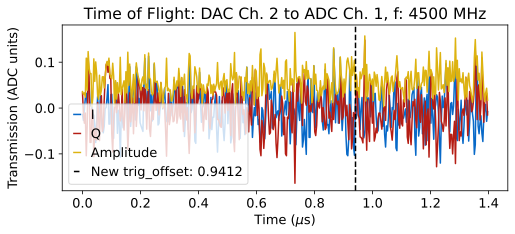

In [11]:
qubit_list = np.arange(3)
qubit_list = [1]
for qi in qubit_list:  
        # tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length (up to 13 us for standard ZCU216 firmware, readout)
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi, params={'frequency':4500})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [ ]:
qubit_list=np.arange(1)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.52, qi)

## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [ ]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

### Res 

In [ ]:
qi=2 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
params={'start':3000, 'span':5000, 'reps':1000, 'gain':0.1, 'expts':1000}
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', progress=True, params=params)
res_values = rspecc.data['coarse_peaks']

In [ ]:
res_values = np.delete(res_values, 2)

## Fine

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)


  0%|          | 0/286000 [00:00<?, ?it/s]

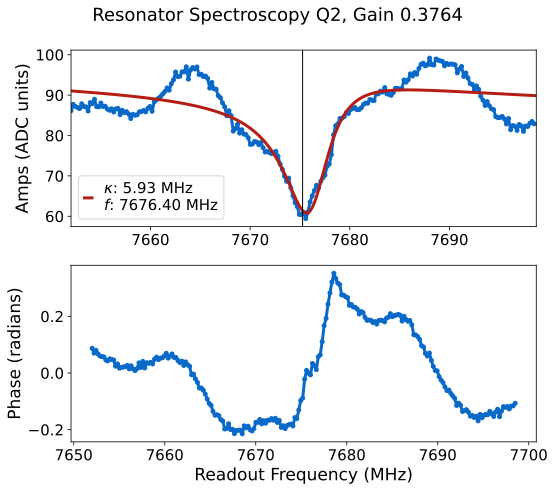

*Set cfg device.readout 2 frequency to 7675.5872 from 7675.2665*
*Set cfg device.readout 2 kappa to 5.9335 from 6.7012*
*Set cfg device.readout 2 qi to 0.1983 from 0.1695*
*Set cfg device.readout 2 qe to 0.3721 from 0.3533*


In [30]:
update = True

# Per-qubit experiment params (RF attenuation/filter settings come from config)
qubit_list = [2]

for qi in qubit_list:
    # Activate this qubit's RF settings from config
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa',})

    if update:
        rspec.update()
        auto_cfg = config.load(cfg_path)

## Resonator Power Spectroscopy
Per-qubit RF overrides are passed explicitly since power spec uses
different attenuations than the standard config values.

In [ ]:
update = True

qubit_list = [2]

d = []
for qi in qubit_list:
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    rpowspec = meas.ResSpecPower(cfg_dict, qi=qi)#, params={'span':7,'f_off':0,'reps':1})
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)
        auto_cfg = config.update_readout(cfg_path, 'kappa', rpowspec.data['kappa'], qi)

## Tune resonator (flux)

In [ ]:
qubit_list = [2]
qi = 2

rfboard.setup_readout_chain(qi, soc, auto_cfg, bw_adc=1000, bw_dac=100, atten1_dac=30, atten2_dac=0, atten_adc=30)
params = {
    # inner 1D settings
    "span": 20, "expts": 500, "gain": 0.3,
    # outer DC sweep settings
    "start_dc": 0, "stop_dc": 0.5, "expts_dc": 101, 
    "dc_settle": 0.005,
    "dc_verify_print": True 
}
for qi in qubit_list: 
    res_exp_2 = meas.ResSpecFlux(cfg_dict, qi=qi, params=params, go=True, display=True)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)
Performing medium scan


  0%|          | 0/260000 [00:00<?, ?it/s]

R2:0.955	Fit par error:0.015	 Best fit:b'avgi'


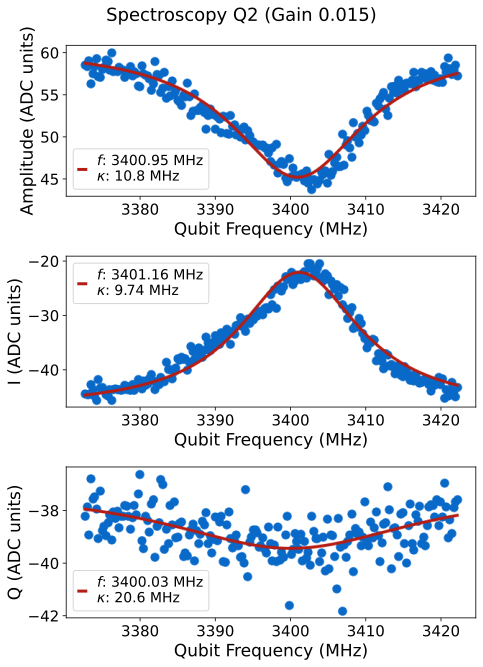

*Set cfg device.qubit 2 f_ge to 3401.1608 from 3397.4053*
Performing fine scan


  0%|          | 0/260000 [00:00<?, ?it/s]

R2:0.969	Fit par error:2.286	 Best fit:b'amps'


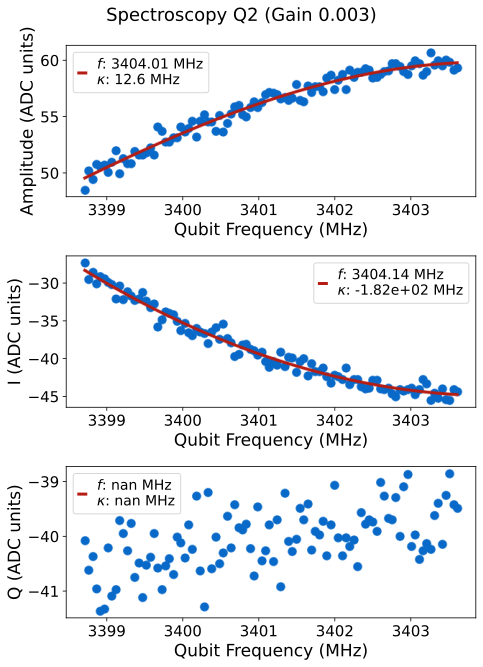

Performing medium scan


  0%|          | 0/260000 [00:00<?, ?it/s]

R2:0.946	Fit par error:0.018	 Best fit:b'avgi'


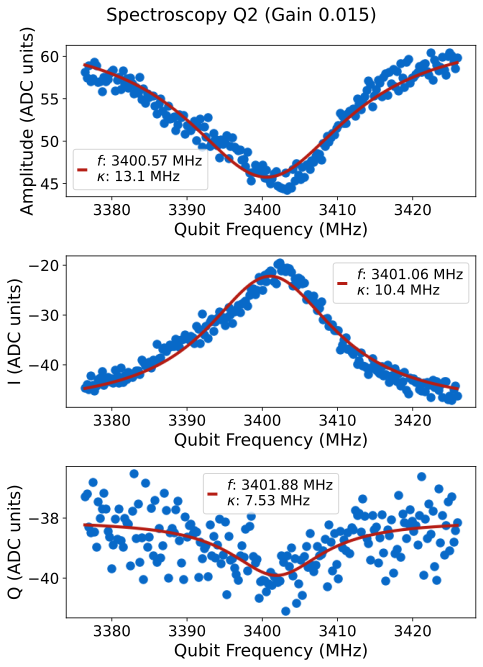

*Set cfg device.qubit 2 f_ge to 3401.0627 from 3401.1608*
Performing fine scan


  0%|          | 0/260000 [00:00<?, ?it/s]

R2:0.290	Fit par error:0.226	 Best fit:b'avgq'


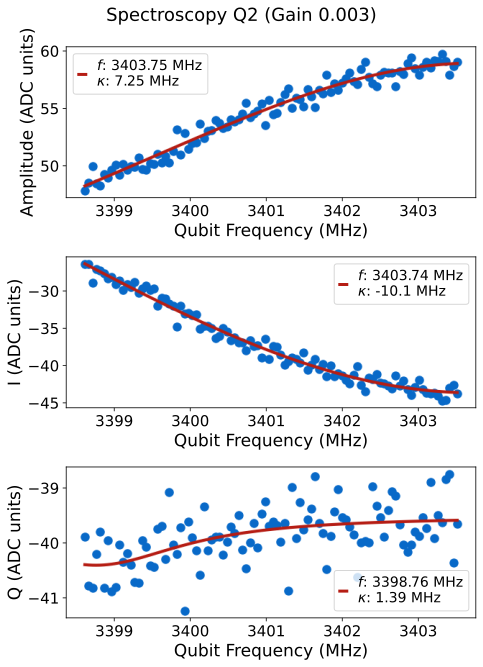

*Set cfg device.qubit 2 f_ge to 3398.7589 from 3401.0627*
Found qubit 2


In [45]:
qubit_list= [2]

bad_qubits=[]
for qi in qubit_list:
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)


  0%|          | 0/260000 [00:00<?, ?it/s]

R2:0.934	Fit par error:0.023	 Best fit:b'avgi'


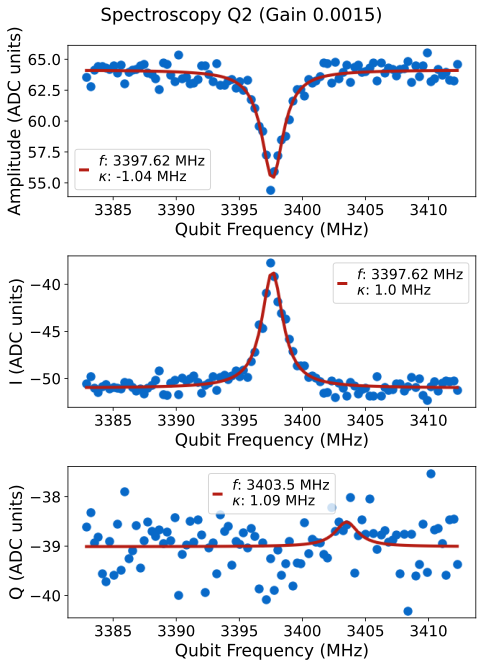

*Set cfg device.qubit 2 f_ge to 3397.6173 from 3397.582*
*Set cfg device.qubit 2 kappa to 2.0094 from 2.864*


In [ ]:
update=True
span = 150
qubit_list = [2]
for qi in qubit_list:
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    
    # set up filter and attenuation  
    #filter_center_freq = 5620
    bw = 500
    #rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, bw=bw)#, center_freq=filter_center_freq)
    
    #start_freq = filter_center_freq - span/2
    #params={'start':start_freq, 'span':span, 'gain':0.02, 'expts':100,  'sep_readout': True, 'length':1, 'readout_length':1, 'reps':15000}
    params={'length':1,'span':30,'gain':0.002}
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine', params=params)

    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

### Loop

In [ ]:
update = True
qubit_list = [0]

# Sweep from 4000 MHz to 8000 MHz
center_freqs = np.arange(4000, 8000 + 1, 250)  # adjust step size as needed

for qi in qubit_list:

    bw = 500

    # Readout chain only needs to be configured once
    rfboard.setup_readout_chain(
        qi,
        soc, auto_cfg,
        bw_adc=500,
        bw_dac=100,
        atten1_dac=30,
        atten2_dac=30,
        atten_adc=30
    )

    for filter_center_freq in center_freqs:

        start_freq = filter_center_freq - bw / 2

        params = {
            'start': start_freq,
            'span': bw,
            'gain': 0.1,
            'expts': 500,
            'sep_readout': False
        }

        qspec = meas.QubitSpec(
            cfg_dict,
            qi=qi,
            style='fine',
            params=params
        )

        if update and qspec.status:
            auto_cfg = config.update_qubit(
                cfg_path,
                'f_ge',
                qspec.data["best_fit"][2],
                qi
            )
            auto_cfg = config.update_qubit(
                cfg_path,
                'kappa',
                2 * qspec.data["best_fit"][3],
                qi
            )
        elif update:
            print(f'Bad qubit! qi={qi}, center={filter_center_freq}')

### Fast Flux 

In [215]:
import os
from datetime import datetime

R2:0.824	Fit par error:0.028	 Best fit:b'avgi'
R2:0.886	Fit par error:0.022	 Best fit:b'avgi'
R2:0.897	Fit par error:0.021	 Best fit:b'avgi'
R2:0.871	Fit par error:0.023	 Best fit:b'avgi'
R2:0.842	Fit par error:0.026	 Best fit:b'avgi'
R2:0.883	Fit par error:0.022	 Best fit:b'avgi'
R2:0.893	Fit par error:0.021	 Best fit:b'avgi'
R2:0.894	Fit par error:0.021	 Best fit:b'avgi'
R2:0.867	Fit par error:0.024	 Best fit:b'avgi'
R2:0.897	Fit par error:0.021	 Best fit:b'avgi'
R2:0.890	Fit par error:0.022	 Best fit:b'avgi'
R2:0.877	Fit par error:0.023	 Best fit:b'avgi'
R2:0.843	Fit par error:0.026	 Best fit:b'avgi'
R2:0.858	Fit par error:0.025	 Best fit:b'avgi'
R2:0.769	Fit par error:0.033	 Best fit:b'avgi'
R2:0.671	Fit par error:0.043	 Best fit:b'avgi'
R2:0.871	Fit par error:0.024	 Best fit:b'avgi'
R2:0.891	Fit par error:0.021	 Best fit:b'avgi'
R2:0.908	Fit par error:0.020	 Best fit:b'avgi'
R2:0.921	Fit par error:0.018	 Best fit:b'avgi'
R2:0.898	Fit par error:0.021	 Best fit:b'avgi'
R2:0.828	Fit 

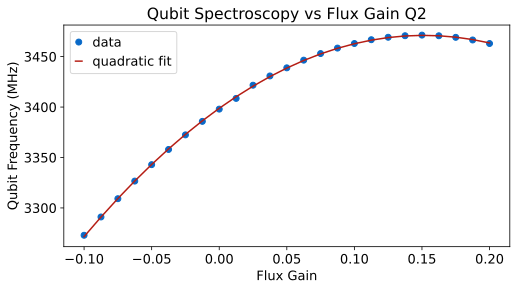

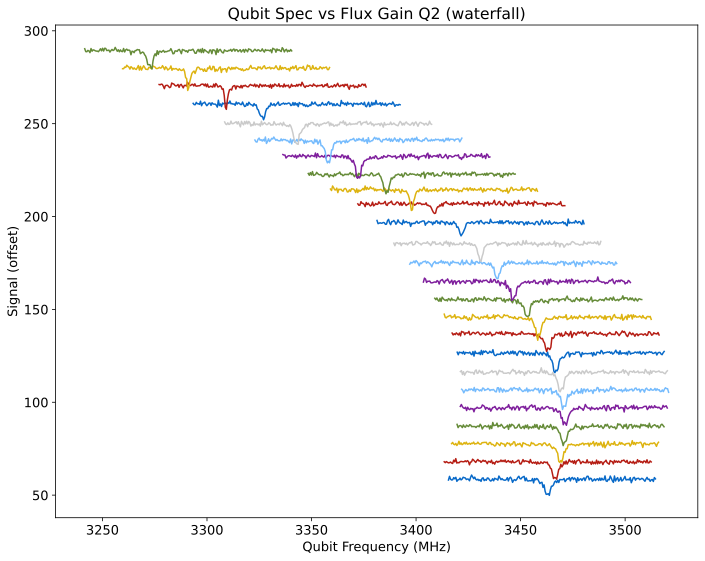

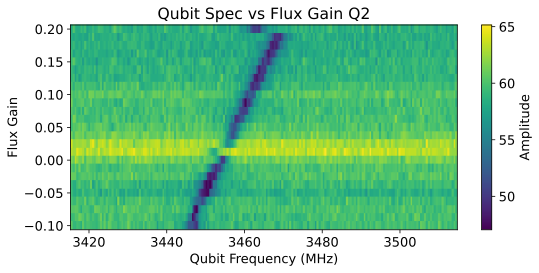

In [12]:
qsff = meas.QubitSpecFastFlux(cfg_dict, qi=2, params={
    'gain_start': 0.2, 'gain_stop': -0.1, 'expts_gain': 25,
    'span': 100, 'expts': 200, 'reps': 1000, 'rounds': 2,
    "start_center_freq":3465, 'gain': 0.002, 'length': 1, 'readout_length': 1, 'sep_readout': True,
})

# After completion, get the quadratic coefficients for use in T1FastFlux:
a, b, c = qsff.data["freq_coeffs"]


In [23]:
qsff.data['f_ge_max']
qsff.data['gain_sweet_spot']

0.15129458790010966

R2:0.925	Fit par error:0.088	 Best fit:b'avgi'
R2:0.838	Fit par error:0.141	 Best fit:b'avgi'
R2:0.841	Fit par error:0.144	 Best fit:b'avgi'
R2:0.889	Fit par error:0.110	 Best fit:b'avgi'
R2:0.916	Fit par error:0.097	 Best fit:b'avgi'
R2:0.917	Fit par error:0.097	 Best fit:b'avgi'
R2:0.846	Fit par error:0.132	 Best fit:b'avgi'
R2:0.779	Fit par error:0.181	 Best fit:b'avgi'
R2:0.930	Fit par error:0.086	 Best fit:b'avgi'
R2:0.902	Fit par error:0.103	 Best fit:b'avgi'
R2:0.889	Fit par error:0.122	 Best fit:b'avgi'
R2:0.871	Fit par error:0.117	 Best fit:b'avgi'
R2:0.929	Fit par error:0.098	 Best fit:b'avgi'
R2:0.874	Fit par error:0.113	 Best fit:b'avgi'
R2:0.874	Fit par error:0.125	 Best fit:b'avgi'


 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 168

R2:0.821	Fit par error:0.139	 Best fit:b'avgi'
R2:0.929	Fit par error:0.085	 Best fit:b'avgi'
R2:0.934	Fit par error:0.083	 Best fit:b'avgi'
R2:0.864	Fit par error:0.126	 Best fit:b'avgi'
R2:0.848	Fit par error:0.145	 Best fit:b'avgi'
R2:0.911	Fit par error:0.100	 Best fit:b'avgi'
R2:0.902	Fit par error:0.117	 Best fit:b'avgi'
R2:0.883	Fit par error:0.116	 Best fit:b'avgi'
R2:0.877	Fit par error:0.124	 Best fit:b'avgi'
R2:0.855	Fit par error:0.146	 Best fit:b'avgi'
R2:0.816	Fit par error:0.153	 Best fit:b'avgi'
R2:0.636	Fit par error:0.260	 Best fit:b'avgi'
R2:0.667	Fit par error:0.263	 Best fit:b'avgi'
R2:0.759	Fit par error:0.257	 Best fit:b'avgi'
R2:0.878	Fit par error:0.184	 Best fit:b'avgi'
R2:0.898	Fit par error:0.167	 Best fit:b'avgi'
R2:0.940	Fit par error:0.103	 Best fit:b'avgi'
R2:0.955	Fit par error:0.079	 Best fit:b'avgi'
R2:0.958	Fit par error:0.080	 Best fit:b'avgi'
R2:0.975	Fit par error:0.060	 Best fit:b'avgi'
R2:0.971	Fit par error:0.060	 Best fit:b'avgi'
R2:0.952	Fit 

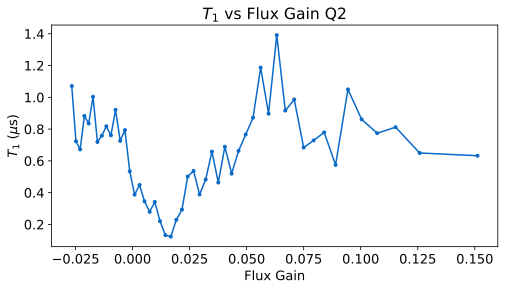

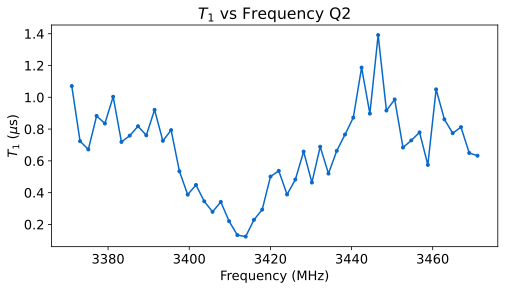

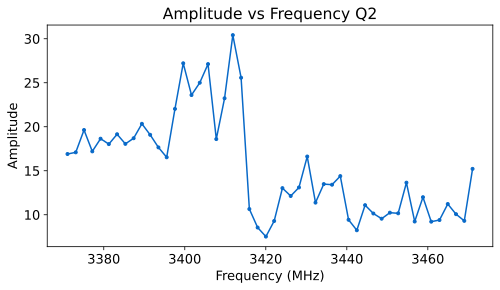

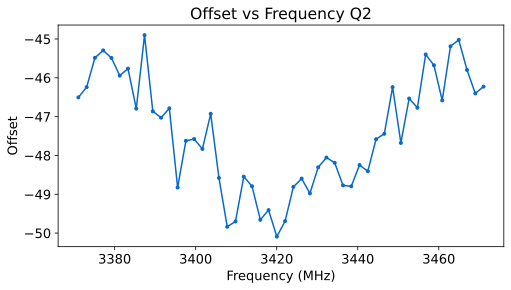

In [19]:
meas.T1FastFlux(cfg_dict, qi=2, params={"freq_span": 100, "direction": "neg","start_t1":1.2,"expts_gain":50})

In [ ]:
auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

meas.T1FastFlux(cfg_dict, qi=2, params={"gain_start":-0.1, "gain_stop":0.4,"start_t1":2,"expts_gain":60,"lin_freq":False,"t1_max":3})

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)
R2:0.898	Fit par error:0.150	 Best fit:b'avgi'
R2:0.927	Fit par error:0.087	 Best fit:b'avgi'
R2:0.832	Fit par error:0.136	 Best fit:b'avgi'
R2:0.786	Fit par error:0.146	 Best fit:b'avgi'
R2:0.839	Fit par error:0.124	 Best fit:b'avgi'
R2:0.720	Fit par error:0.178	 Best fit:b'avgi'
R2:0.869	Fit par error:0.119	 Best fit:b'avgi'
R2:0.859	Fit par error:0.117	 Best fit:b'avgi'
R2:0.924	Fit par error:0.085	 Best fit:b'avgi'
R2:0.951	Fit par error:0.070	 Best fit:b'avgi'
R2:0.972	Fit par error:0.056	 Best fit:b'avgi'
R2:0.936	Fit par error:0.080	 Best fit:b'avgi'
R2:0.962	Fit par error:0.064	 Best fit:b'avgi'
R2:0.887	Fit par error:0.125	 Best fit:b'avgi'
R2:0.828	Fit par error:0.212	 Best fit:b'avgi'
R2:0.853	Fit par error:0.204	 Best fit:b'avgi'
R2:0.899	Fit par error:0.138	 Best fit:b'avgi'
R2:0.932	Fit par error:0.094	

RuntimeError: Pulse length of 469077 cycles exceeds the max of 2**16 - use multiple pulses or a periodic pulse?

In [ ]:

t1ff = meas.T1FastFlux(cfg_dict, qi=2, params={
    'gain_start': 0.16, 'gain_stop': -0.4, 'expts_gain': 50,
    'freq_coeffs': (a, b, c), 'lin_freq': True,
    'reps': 2000, 'expts': 50, 'span': 25, 'rounds': 10, 'start': 0.01,
})

### Flux sweep

Flux sweep resonator first, and then use the values to guide qubit sweep

In [ ]:
import time

In [ ]:
fluxes = np.arange(0,0.2,0.05)
fluxes = list(fluxes)
qi = 2
for flux in fluxes:
    print(f"Setting flux bias to {flux:.2f} V")
    soc.rfb_set_bias(3, flux)
    time.sleep(0.1)  # wait for bias to settle


    #Resonator measurement
    # Per-qubit experiment params (RF attenuation/filter settings come from config)

    # Activate this qubit's RF settings from config
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa',})
    rspec.update()
    auto_cfg = config.load(cfg_path)
    
    filter_start_freq = 3420
    bw = 1150
    # set up filter and attenuation  
    rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, bw=bw, atten1_dac=30, atten2_dac=25, center_freq=filter_center_freq-bw/2)
    start_freq = filter_start_freq
    params={'start':start_freq, 'span':100, 'gain':0.5, 'expts':200, 'reps':1000, 'rounds':10, 'sep_readout': True, 'length':1, 'readout_length':8}
    
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine', params=params)
    plt.show()
    

In [ ]:

qubit_list = [2]
qi = 2

filter_center_freq = 3424
rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, bw=750, atten1_dac=30, atten2_dac=25, center_freq=filter_center_freq)
        
params = {
    # inner 1D settings
    "span": 100, "expts": 200, "reps": 1000, "gain": 0.5,
    'rounds': 100,
    # outer DC sweep settings
    "dc_start": -0.035, "dc_stop": 0.2, "expts_dc": 236,
    "bias_chan": 3,         
    "recenter_res": True,         # enable inline recentering
    "recenter_res_span": 10,       # MHz span around current f0
    "recenter_res_expts": 101,    # points per ResSpec
    "dc_settle": 0.1, # wait time after setting DC value before next measurement
    "dc_verify_print": True, # toggle to True if you want readback per row
    'sep_readout': True, 'length':8, 'readout_length':8
}
for qi in qubit_list: 
    exp = meas.QubitSpecFlux(cfg_dict, qi=qi, params=params, go=True, display=True)
    # data is in exp.data; plot saved via exp.display()


In [ ]:
print("read bias:", soc.rfb_get_bias(channel))

In [ ]:
print("set bias:", soc.rfb_set_bias(channel, 0.0))

Ramp down

In [ ]:
channel = 3
step = 0.01
max_val = 0.2
num_steps = int(max_val / step)
range = __builtins__.range
import time
for i in range(num_steps + 1):
    current = max_val - i * step
    print(f"--- {current:.1f}V ---")
    print("read bias:", soc.rfb_get_bias(channel))
    print("set bias:", soc.rfb_set_bias(channel, current))
    print("read bias:", soc.rfb_get_bias(channel))
    time.sleep(1)

### Loop

In [ ]:
qubit_list = [2]

# Sweep filter center from 1500 MHz to 8000 MHz
center_freqs = np.arange(1500, 8000 + 1, 250)  # step size = 250 MHz (adjust as needed)

d = []

for qi in qubit_list:
    bw = 500  # filter bandwidth

    for filter_center_freq in center_freqs:

        # Set up filter and attenuation
        rfboard.setup_qubit_drive_chain(
            qi,
            soc, auto_cfg,
            bw=bw,
            atten1_dac=0,
            atten2_dac=0,
            center_freq=filter_center_freq
        )

        # Keep spectroscopy sweep centered around filter center
        span = 500
        start_freq = filter_center_freq - span / 2

        params = {
            'start': start_freq,
            'span': bw,
            'gain': 0.1,
            'expts': 500,
            'sep_readout': False
        }

        qspec=meas.QubitSpec(cfg_dict, qi=qi, style='fine', params=params)

        d.append(qspec)

# handy.plot_many(d, title='Qubit Power')

In [ ]:
qubit_list=[2]

d = []
for qi in qubit_list:
    # set up filter a`nd attenuation  
    filter_center_freq = 6000
    bw = 500
    # set up filter and attenuation  
    rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, bw=bw, center_freq=filter_center_freq)
    
    #params={'start':6050,'span':300,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1,'sep_readout':True, 'reps':5000}
    start_freq = filter_center_freq - 500/2
    params={'start':start_freq,'span':500,'expts':500,'sep_readout':False}#,'expts':200, 'max_gain':1, 'rng':100,"expts_gain": 22, 'length':1, 'reps':5000}
    # params={'sep_readout':False,'rng':1000,'span':500}
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='coarse', params=params)
    d.append(qspec_pow)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})
# handy.plot_many(d, title='Qubit Power')

In [ ]:
qubit_list = [2]

params = {
    # inner 1D settings
    "span": 1000, "expts": 500, "reps": 1000, "gain": 0.005,
    # outer DC sweep settings
    "dc_start": -1.0, "dc_stop": 1.0, "expts_dc": 101,
    "bias_chan": 0,         
    "dc_settle": 0.02, 
    "dc_verify_print": False, # toggle to True if you want readback per row
    "bias_table_V": df["bias_V"].to_numpy(),
    "f0_table_MHz": df["f0_MHz"].to_numpy()
}
for qi in qubit_list: 
    exp = meas.QubitSpecFlux(cfg_dict, qi=qi, params=params, go=True, display=True)
    # data is in exp.data; plot saved via exp.display()


## Stark (still getting it working)

Unexpected parameters found in params: {'stark_freq'}


  0%|          | 0/13000000 [00:00<?, ?it/s]

n photons/unit gain: 28.60108834142675


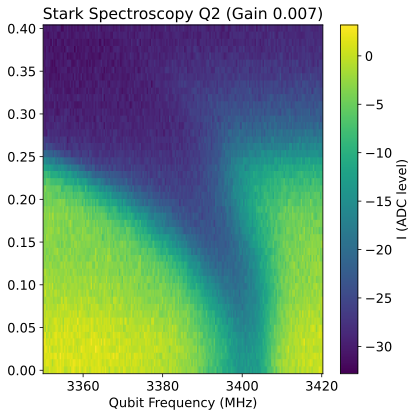

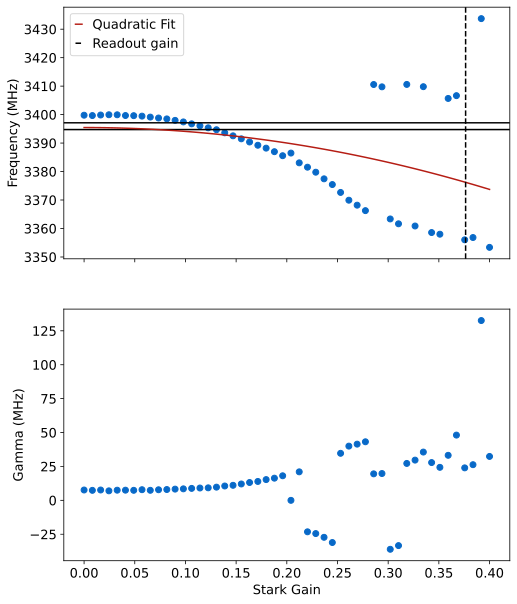

In [68]:
qi=2
params={'df_stark':0, 'max_stark_gain':0.4, 'df':-12,'span':70, 'stark_expts':50,'stark_rng':50,'gain':0.007}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

In [ ]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.1, 'df':-30,'span':130, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

In [ ]:
auto_cfg_model = config.load(cfg_file_path[:-4] + '_model.yml')
auto_cfg= config.load(cfg_file_path)

k = stark_spec.data['ng2']/auto_cfg_model['g_chi'][qi]
nphotons = auto_cfg['device']['readout']['gain'][qi]**2*k

## Qubit power sweep

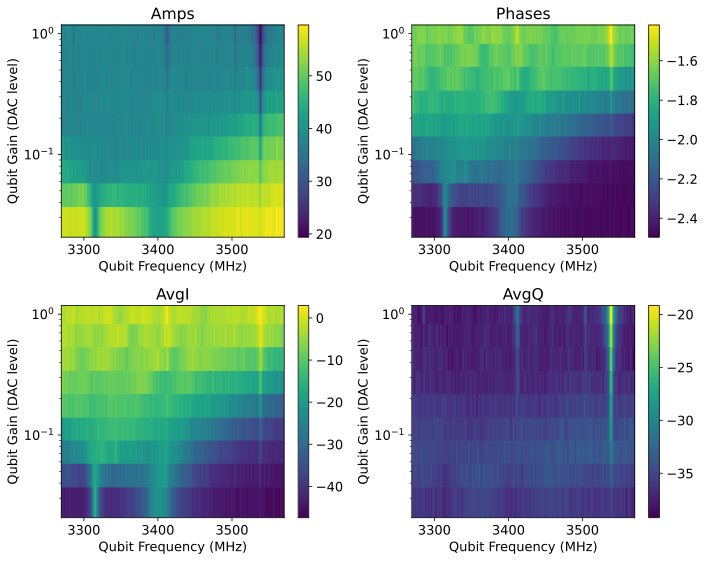

Step 9/15 (60%)


KeyboardInterrupt: 

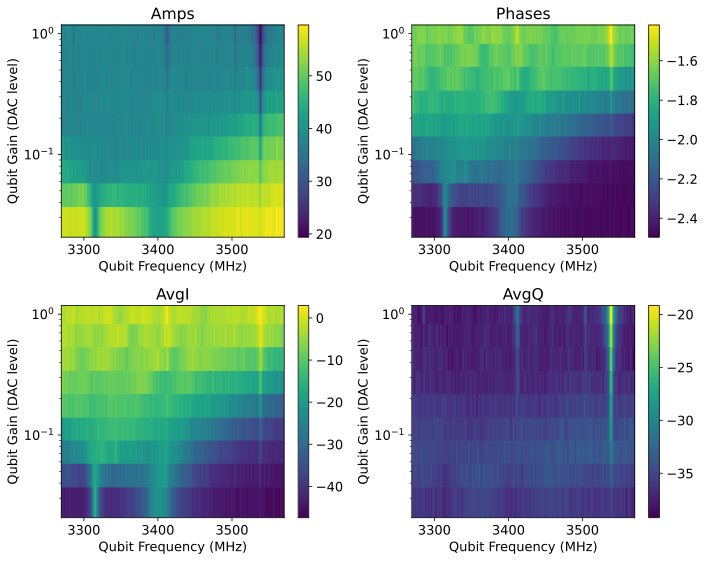

In [38]:
qubit_configs = {
    0: {'filter_center_freq': 5600.1338, 'bw': 500, 'atten1_dac': 5, 'atten2_dac': 0,
        'params': {'span': 500, 'reps':5000,'length':1}},
    1: {'filter_center_freq': 4539.224, 'bw': 500, 'atten1_dac': 10, 'atten2_dac': 0,
        'params': {'start': 4250, 'span': 500,'rng':200,'length':1,'max_gain':0.8,'start':4100,'expts':1000, 'expts_gain':25}},
    2: {'filter_center_freq': 3250, 'bw': 500, 'atten1_dac': 0, 'atten2_dac': 0,
        'params': {'start': 3270, 'span': 300,'max_gain':1,'rng':500,'expts':300, 'expts_gain':15,'length':2,'flux':True}},
    3: {'filter_center_freq': 2530, 'bw': 1500, 'atten1_dac': 0, 'atten2_dac': 0,
        'params': {'start': 2000, 'span': 1200,'length':1}},
}

qubit_list = [2]

d = []
for qi in qubit_list:
    qcfg = qubit_configs[qi]
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

    rfboard.setup_qubit_drive_chain(
        qi, soc, auto_cfg,
        bw=qcfg['bw'],
        atten1_dac=qcfg['atten1_dac'],
        atten2_dac=qcfg['atten2_dac'],
        center_freq=qcfg['filter_center_freq'],
    )

    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='coarse', params=qcfg['params'], live_plot=True)
    d.append(qspec_pow)

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

In [ ]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        params={'start':3000,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True}
        params={'start':4000,'span':200,'expts':300,'length':l}
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)

### Narrow scan

In [ ]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list:
    params={'rng':200, 'pulse_length':0.5,'reps':1500,'expts':500,'expts_f':20}
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow', params=params)#, live_plot=True)
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

In [ ]:
# qubit_list = np.arange(3)
qubit_list=[1]


#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad;
# gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, 
# try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=True, single=False, readout=True)

## Time tracking
fast = True only measures T2 and T1, otherwise does full set of scans.

In [ ]:
scan_length = 18 #  hours 

qubit_list = [1, 2]
tt, csv_pth, tt_stats = time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True, soc=soc)

Starting run 0, for qubit 1. Time elapsed 0.00 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.973	Fit par error:0.068	 Best fit:b'avgi'
R2:0.767	Fit par error:0.088	 Best fit:b'avgi'
Starting run 0, for qubit 2. Time elapsed 0.00 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.965	Fit par error:0.652	 Best fit:b'avgi'
R2:0.935	Fit par error:0.062	 Best fit:b'avgi'
Starting run 1, for qubit 1. Time elapsed 0.00 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.924	Fit par error:0.124	 Best fit:b'avgi'
R2:0.912	Fit par error:0.054	 Best fit:b'avgi'
Starting run 1, for qubit 2. Time elapsed 0.00 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), 

 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 635OptimizeWarning: Covariance of the parameters could not be estimated
 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 693

R2:0.800	Fit par error:0.099	 Best fit:b'avgi'
Starting run 3, for qubit 2. Time elapsed 0.00 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.971	Fit par error:0.307	 Best fit:b'avgi'
R2:0.664	Fit par error:4742110.933	 Best fit:b'avgi'
R2:0.664	Fit par error:2096980.869	 Best fit:b'avgi'
Starting run 4, for qubit 1. Time elapsed 0.00 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.894	Fit par error:0.117	 Best fit:b'avgi'
R2:0.821	Fit par error:0.104	 Best fit:b'avgi'
Starting run 4, for qubit 2. Time elapsed 0.00 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.968	Fit par error:0.267	 Best fit:b'avgi'
R2:0.957	Fit par error:0.050	 Best fit:b'avgi'
Starting ru

 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 688

R2:0.793	Fit par error:0.100	 Best fit:b'avgi'
Starting run 10, for qubit 2. Time elapsed 0.01 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.963	Fit par error:1.903	 Best fit:b'avgi'
R2:0.643	Fit par error:1945185.386	 Best fit:b'avgi'
R2:0.643	Fit par error:1692064.941	 Best fit:b'avgi'
Starting run 11, for qubit 1. Time elapsed 0.01 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.962	Fit par error:0.136	 Best fit:b'avgi'
R2:0.877	Fit par error:0.073	 Best fit:b'avgi'
Starting run 11, for qubit 2. Time elapsed 0.01 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.960	Fit par error:0.276	 Best fit:b'avgi'
R2:0.713	Fit par error:1761129.474	 Best fit:b'avgi'
R2

 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 360

R2:0.933	Fit par error:0.094	 Best fit:b'avgi'
R2:0.827	Fit par error:0.076	 Best fit:b'avgi'
Starting run 48, for qubit 2. Time elapsed 0.05 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.983	Fit par error:0.584	 Best fit:b'avgi'
R2:0.524	Fit par error:2304282.584	 Best fit:b'avgi'
R2:0.524	Fit par error:2254913.114	 Best fit:b'avgi'
Starting run 49, for qubit 1. Time elapsed 0.05 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.964	Fit par error:0.089	 Best fit:b'avgi'
R2:0.840	Fit par error:0.075	 Best fit:b'avgi'
Starting run 49, for qubit 2. Time elapsed 0.05 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.953	Fit par error:0.840	 Best fit:b'avgi'
R2:0.483

 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 633

R2:0.000	Fit par error:inf	 Best fit:b'avgi'
R2:0.754	Fit par error:0.084	 Best fit:b'avgi'
Starting run 67, for qubit 2. Time elapsed 0.07 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.969	Fit par error:0.138	 Best fit:b'avgi'
R2:0.721	Fit par error:16296428.490	 Best fit:b'avgi'
R2:0.721	Fit par error:139518.253	 Best fit:b'avgi'
Starting run 68, for qubit 1. Time elapsed 0.07 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.957	Fit par error:0.086	 Best fit:b'avgi'
R2:0.861	Fit par error:0.068	 Best fit:b'avgi'
Starting run 68, for qubit 2. Time elapsed 0.07 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.970	Fit par error:0.181	 Best fit:b'avgi'
R2:0.772	F

 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 168

R2:0.967	Fit par error:0.092	 Best fit:b'avgi'
R2:0.900	Fit par error:0.056	 Best fit:b'avgi'
Starting run 187, for qubit 2. Time elapsed 0.19 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.986	Fit par error:0.213	 Best fit:b'avgi'
R2:0.541	Fit par error:2486369.132	 Best fit:b'avgi'
R2:0.541	Fit par error:1588512.254	 Best fit:b'avgi'
Starting run 188, for qubit 1. Time elapsed 0.19 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.966	Fit par error:0.085	 Best fit:b'avgi'
R2:0.808	Fit par error:0.076	 Best fit:b'avgi'
Starting run 188, for qubit 2. Time elapsed 0.19 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.972	Fit par error:0.455	 Best fit:b'avgi'
R2:0.

 C:\_Lib\python\qq\slab_qick_calib\analysis\fitting.py: 700

R2:0.808	Fit par error:0.083	 Best fit:b'avgi'
Starting run 288, for qubit 2. Time elapsed 0.29 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.982	Fit par error:0.275	 Best fit:b'avgi'
R2:0.695	Fit par error:1738383.602	 Best fit:b'avgi'
R2:0.695	Fit par error:162473.740	 Best fit:b'avgi'
Starting run 289, for qubit 1. Time elapsed 0.29 hrs
Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)
R2:0.961	Fit par error:0.120	 Best fit:b'avgi'
R2:0.789	Fit par error:0.081	 Best fit:b'avgi'
Starting run 289, for qubit 2. Time elapsed 0.29 hrs
Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)
R2:0.979	Fit par error:0.301	 Best fit:b'avgi'
R2:0.716	Fit par error:1485731.296	 Best fit:b'avgi'


In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(np.array(tt[0]['time']), np.array(tt[0]['t1']),'hi')

In [ ]:
qubit_params.stats(cfg_path, tt_stats, qubit_list)

In [ ]:
# Activate qubit drive RF settings from config
auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path, channels=('dac_qubit',))

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

[autoreload of slab_qick_calib.experiments.general.qick_experiment_2q failed: Traceback (most recent call last):
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 475, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\importlib\__init__.py", line 131, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 866, in _exec
  File "<frozen importlib._bootstrap_external>", line 999, in exec_module
  File "<frozen importlib._bootstrap>", line 488, in _call_with_frames_removed
  File "C:\_Lib\python\qq\slab_qick_calib\experiments\general\qick_experiment_2q.py", line 26, in <module>
    from .qick_experiment import DisplayManager, _wrap_display_method
ImportError: cann

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)


[autoreload of slab_qick_calib.experiments.general.qick_experiment failed: Traceback (most recent call last):
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 500, in superreload
    update_generic(old_obj, new_obj)
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 397, in update_generic
    update(a, b)
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 349, in update_class
    if update_generic(old_obj, new_obj):
       ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site-packages\IPython\extensions\autoreload.py", line 397, in update_generic
    update(a, b)
  File "c:\Users\circu\anaconda3\envs\qick_calib\Lib\site

  0%|          | 0/78000 [00:00<?, ?it/s]

R2:0.964	Fit par error:0.020	 Best fit:b'avgi'


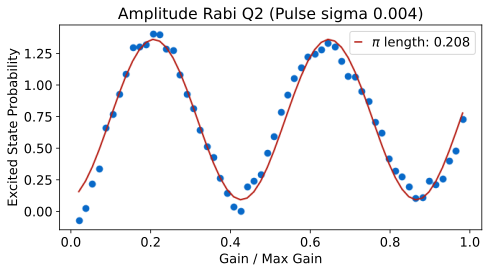

*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2076 from 0.26*


In [17]:
# qubit_list = np.arange(3)
qubit_list=[2]

update=True
for qi in qubit_list: 
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    # amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)#, disp_kwargs={'show_hist':True})
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi,disp_kwargs={"display":None, "rescale":True})#, disp_kwargs={'show_hist':True})
    
    # Fully customized version
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':200, "length":0.015,'max_gain':0.5, 'reps': 500, 'rounds': 1})#, disp_kwargs={'show_hist':True})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)

Activated qubit 1: ADC ch 0 (fc=7146.7939, bw=100, bandpass), DAC-ro ch 0 (fc=7146.7939, bw=100, bandpass), DAC-qb ch 1 (fc=4439.224, bw=100, bandpass)


  0%|          | 0/30 [00:00<?, ?it/s]

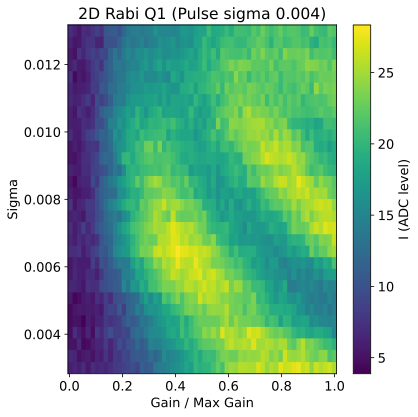

In [47]:
qi=1
auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
amp_rabi = meas.Rabi2D(cfg_dict,qi=qi, params={'max_gain':1,'span_y':0.01})#, disp_kwargs={'show_hist':True})


In [ ]:
# qubit_list = np.arange(3)
qubit_list=[1]

update=True

for qi in qubit_list: 
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    # amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)#, disp_kwargs={'show_hist':True})
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'max_gain': 1, 'sigma': 0.007, 'reps': 1000, 'rounds': 1})#, disp_kwargs={'show_hist':True})
    
    # Fully customized version
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':200, "length":0.015,'max_gain':0.5, 'reps': 500, 'rounds': 1})#, disp_kwargs={'show_hist':True})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

In [ ]:
# qubit_list = np.arange(3)
qubit_list=[2]

update=False

for qi in qubit_list: 
    rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, atten1_dac=15)

    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'max_gain': 1, 'sigma': 0.01, 'reps': 10000, 'rounds': 3})#, disp_kwargs={'show_hist':True})
    
    # Fully customized version
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':200, "length":0.015,'max_gain':0.5, 'reps': 500, 'rounds': 1})#, disp_kwargs={'show_hist':True})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)

In [ ]:
# Override qubit drive with high attenuation
rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, atten1_dac=30, atten2_dac=30)

In [ ]:
# qubit_list = np.arange(3)
qubit_list=[1]

update=True

for qi in qubit_list: 
    # amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)#, disp_kwargs={'show_hist':True})
    rfboard.setup_qubit_drive_chain(qi, soc, auto_cfg, atten1_dac=0, atten2_dac=0)
    
    # Fully customized version
    # amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':100,'reps':5000, 'sigma':0.3})#, disp_kwargs={'show_hist':True})
    amp_rabi = meas.RabiExperiment(
    cfg_dict, qi=qi,
    params={'expts': 100, 'length': 0.1, 'reps': 1000, 'max_length': 0.5, 'pulse_type': 'const', 'sweep':'length', 'gain': 1, 'rounds': 5},
)

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

### Many pi pulses rabi

In [ ]:
qi=0
update=False

amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'n_pulses':15})
if update and amp_rabi.status:
    ind = np.argmax(amp_rabi.fitfunc(amp_rabi.data['xpts'], *amp_rabi.data['best_fit']))
    config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['xpts'][ind], qi);

### Amp Chevron

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass)


  0%|          | 0/30 [00:00<?, ?it/s]

Chevron fit failed to converge.
Error saving dataset 'chevron_freq_fit': Object dtype dtype('O') has no native HDF5 equivalent
Error saving dataset 'chevron_amp_fit': Object dtype dtype('O') has no native HDF5 equivalent


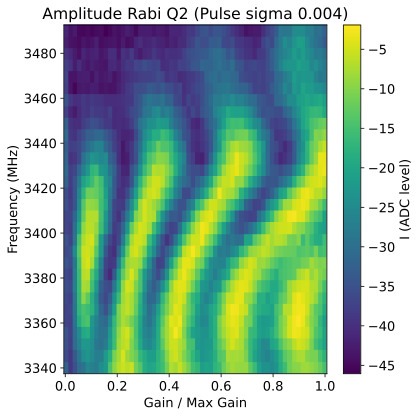

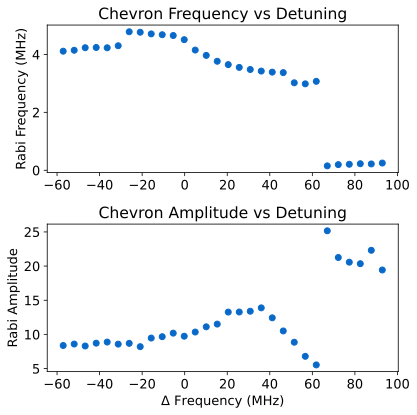

In [56]:
d2=[]
#qubit_list = np.arange(3)
qubit_list=[2]

for qi in qubit_list: 
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':260,'expts_f':70, 'expts':120, 'reps': 1000,'checkEF':False,'start_f':3210, 'sigma':s,'max_gain':1})#, params={'span_f':150,'sigma':0.25,'expts_f':100,'expts':100})

    amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':150,'expts_f':30, 'max_gain':1, 'start_f':3340})#, live_plot=True)
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

### Run multiple chevron with different sigma

  0%|          | 0/30 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\experiments\single_qubit\rabi.py: 738

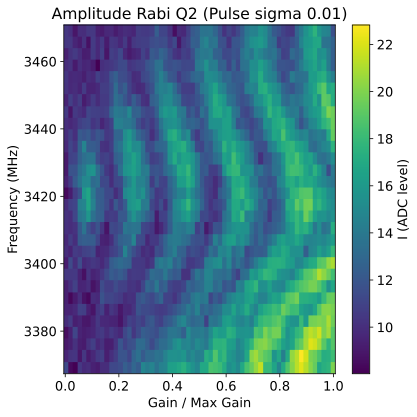

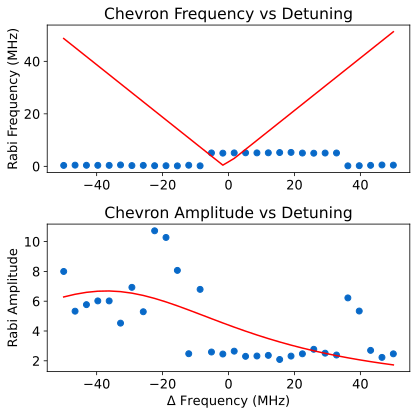

  0%|          | 0/30 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
d2=[]
#qubit_list = np.arange(3)
qubit_list=[2]
sigma = [0.005,0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]
max_gain = [1, 1, 1, 0.5, 0.5, 0.5, 0.25, 0.25, 0.25, 0.25]
for mg, s in zip(max_gain,sigma):
    for qi in qubit_list: 
        #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':260,'expts_f':70, 'expts':120, 'reps': 1000,'checkEF':False,'start_f':3210, 'sigma':s,'max_gain':1})#, params={'span_f':150,'sigma':0.25,'expts_f':100,'expts':100})

        amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':100, 'expts_f':30, 'reps':1200,'max_gain':1})#, live_plot=True)
        d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

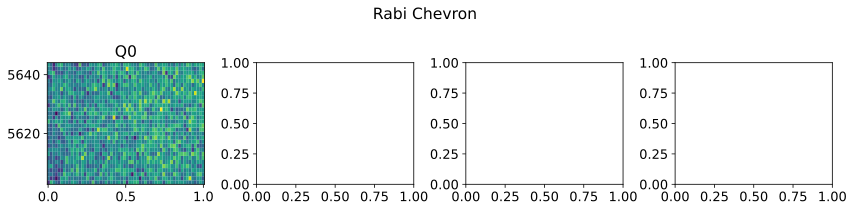

In [29]:
handy.plot_many(d2, title='Rabi Chevron', save_path=cfg_dict['expt_path'], chan='avgq')

In [ ]:
amp_rabi_chevron.display(plot_both=True)

### Length -- Uses const pulses so do not use to set up pi pulses

Cannot do fast sweep with gaussian pulses due to multiplying qickparams issues; so need the "loop:True" for those, will make everything slower. 

In [ ]:
qubit_list = [1]
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: cons
    #len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'const', 'max_length':0.2,'gain':0.3})

#### Length Chevron

  0%|          | 0/30 [00:00<?, ?it/s]

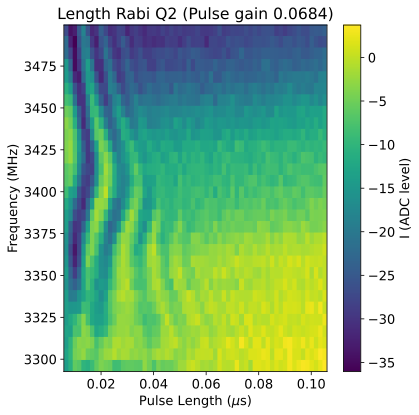

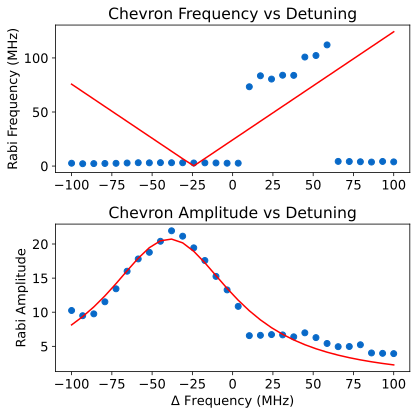

In [27]:
qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list: 
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const", "max_length":0.15,'span_f':200})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"gauss", "max_length":0.15,'span_f':100})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const", 'length':0.03, 'expts_f':40,'gain':0.15,'span_f':200, 'reps':2000})


## Ramsey

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)


  0%|          | 0/4 [00:00<?, ?it/s]

R2:0.994	Fit par error:0.025	 Best fit:b'avgi'


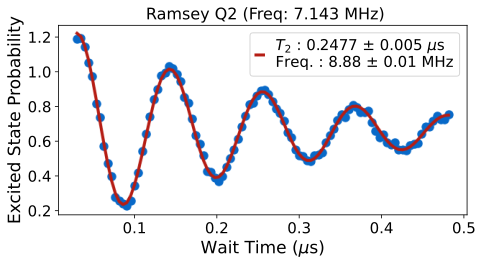

*Set cfg device.qubit 2 f_ge to 3394.9105 from 3396.6487*
*Set cfg device.qubit 2 T2r to 0.25 from 0.21*


In [64]:
qubit_list=[2]
update = True

for qi in qubit_list:
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'expts':100, 'span':1.5,'start':0.01, 'reps':1000, 'rounds':1})#, disp_kwargs={'show_hist':True})
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':3.0,'expts':100, 'span':1,'start':0.01, 'reps':1000, 'rounds':3})
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10,params={'rounds':4},disp_kwargs={ 'rescale':True})
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[0.05, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

In [ ]:
qubit_list=[2]
update = True

for qi in qubit_list:
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'expts':100, 'span':1.5,'start':0.01, 'reps':1000, 'rounds':1})#, disp_kwargs={'show_hist':True})
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':5.0,'expts':100, 'span':1,'start':0.01, 'reps':5000, 'rounds':5})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

### Use Ramsey to recenter

In [ ]:
qubit_list = [0]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


  0%|          | 0/2 [00:00<?, ?it/s]

R2:0.994	Fit par error:0.017	 Best fit:b'avgi'


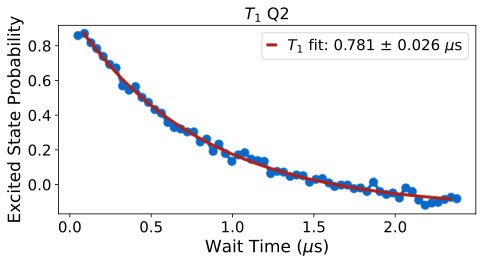

*Set cfg device.qubit 2 T1 to 0.78 from 0.66*
Val is out of range, setting to min
*Set cfg device.readout 2 final_delay to 5.0 from 5.0*


In [33]:
update=True
first_time=False

# qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    #t1 = meas.T1Experiment(cfg_dict, qi=qi)
    #t1 = meas.T1Experiment(cfg_dict, qi=qi)
    t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'rounds':2},disp_kwargs={'show_hist':False, "rescale":True,'display':'talk'})

    if update: t1.update(first_time=first_time)

## T1 with fast flux

### Single scan

  0%|          | 0/10 [00:00<?, ?it/s]

R2:0.354	Fit par error:0.508	 Best fit:b'avgi'


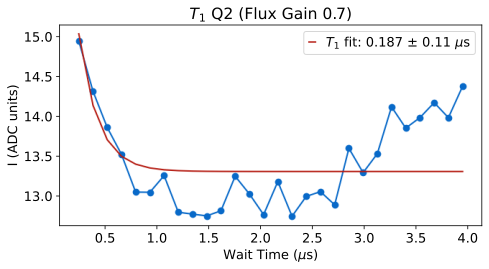

Val is out of range, setting to min
*Set cfg device.qubit 2 T1 to 0.5 from 0.5*
Val is out of range, setting to min
*Set cfg device.readout 2 final_delay to 5.0 from 5.0*


In [ ]:
update=False
cfg_dict["expt_path"] = original_path
# qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':2000,'expts':30, 'span':4, 'rounds':10,'flux':True,'flux_gain':0.7, 'start':0.01})

    if update: t1.update()

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

In [ ]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

In [ ]:
qi=0
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':120000})

In [ ]:
t1cont.display(filter_type='boxcar')

In [ ]:
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])/10

In [ ]:
len(t1cont.data['t1_estimates'])
t1_data = t1cont.data['t1_estimates']

from slab_qick_calib.analysis import time_series
sampling_rate = 1/ float(t1cont.data['times'][2]-t1cont.data['times'][1])
print(f'Sampling rate is {sampling_rate} Hz')
nperseg = min(2048, int(2 ** np.floor(np.log2(len(t1_data) / 4))))

time_series.analyze_qubit_psd(
    t1_data, fs=sampling_rate, nperseg=nperseg
)

plt.figure()
plt.plot(t1cont.data['times'], t1cont.data['t1_estimates'], '.-')

In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(t1cont.data['times'], t1cont.data['t1_estimates'],'hi')

In [ ]:

nan_inds = np.where(np.isnan(t1cont.data['t1_estimates']))[0]

times = np.delete(t1cont.data['times'], nan_inds)
t1_data = np.delete(t1cont.data['t1_estimates'], nan_inds)

In [ ]:
allan.perform_analysis(times, t1_data,'hi')

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo and more

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)


  0%|          | 0/3 [00:00<?, ?it/s]

R2:0.974	Fit par error:0.020	 Best fit:b'avgi'


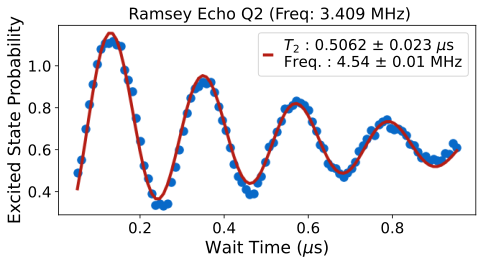

*Set cfg device.qubit 2 T2e to 0.51 from 0.44*


In [41]:
qubit_list = np.arange(3)
qubit_list=[2]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    # t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo','rounds':3},disp_kwargs={'display':'talk','rescale':True})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[0.25, max_t1*2])

In [ ]:
qubit_list = np.arange(3)
qubit_list=[2]
update=False
for qi in qubit_list:
    # Need to have experiment type set to echo
    # t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo'})
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo', 'ramsey_freq':5.0, 'expts':100, 'span':2,'start':0.01, 'reps':5000, 'rounds':3})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi / CPMG
Breaks above 12 right now; need to make it a python loop 

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
update=True
nums_pi = [1,2,3,5,8,12]
t2_list = []
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        #params=params={'experiment_type':'cpmg','num_pi':pi, 'span':400, 'ramsey_freq':0.02, 'reps':500}
        params=params={'experiment_type':'cpmg','num_pi':pi,}
        if pi>1:
            params['span']= t2e.data['fit_avgi'][3]*3.5
            params['ramsey_freq']=1.5/t2e.data['fit_avgi'][3]


        t2e = meas.T2Experiment(cfg_dict, qi=qi, params=params)
        t2_list.append(t2e.data['best_fit'][3])


In [ ]:
plt.figure()
plt.plot(1/np.array(nums_pi), t2_list, 'o-')
plt.xlabel('1/Number of pi pulses')

### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=0
# This makes sure that waits are set correctly for active reset so that you get the same value from the buffer as ... 
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':10})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':10000,'active_reset':False, 'setup_reset':False})
shot.check_reset()

In [ ]:

np.mean(shot.data['Ig'])
np.mean(shot.data['Ie'])

# Single Shot

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)


  0%|          | 0/200000 [00:00<?, ?it/s]

  0%|          | 0/200000 [00:00<?, ?it/s]

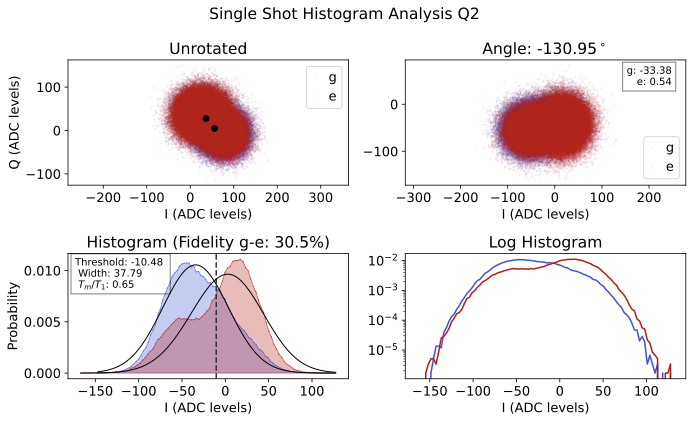

*Set cfg device.readout 2 phase to -130.9517 from 99.2274*
*Set cfg device.readout 2 threshold to -10.4764 from -28.5422*
*Set cfg device.readout 2 fidelity to 0.305 from 0.3229*
*Set cfg device.readout 2 g_mean to -30.3621 from -43.5874*
*Set cfg device.readout 2 e_mean to -6.306 from -18.2539*
*Set cfg device.readout 2 sigma to 37.7936 from 32.9075*
*Set cfg device.readout 2 tm to 0.6533 from 1.0876*
*Set cfg device.qubit 2 tuned_up to True from True*


In [12]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[2]

for qi in qubit_list:
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

    #shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':200000})
    shot.update()

### Adjust reps for fidelity 

In [96]:
max_inc = 10 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [1]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

*Set cfg device.readout 1 reps to 6.1348 from 5*


## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

Activated qubit 2: ADC ch 0 (fc=7681.8329, bw=500, bandpass), DAC-ro ch 0 (fc=7681.8329, bw=100, bandpass), DAC-qb ch 1 (fc=3470, bw=100, bandpass), DC bias ch 3 (val=0 V)
Unexpected parameters found in params: {'step_f', 'step_len', 'step_gain'}


  0%|          | 0/5 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 948RuntimeWarning: overflow encountered in exp
 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 291RuntimeWarning: invalid value encountered in multiply
 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 296

Max fidelity 35.066 %
Optimal params: 
 Freq (MHz) 7675.587 
 Gain (DAC units) 0.376 
 Readout length (us) 1.425
Set fidelity: 33.572 %
Set params: 
 Freq (MHz) 7675.587 
 Gain (DAC units) 0.339 
 Readout length (us) 1.425


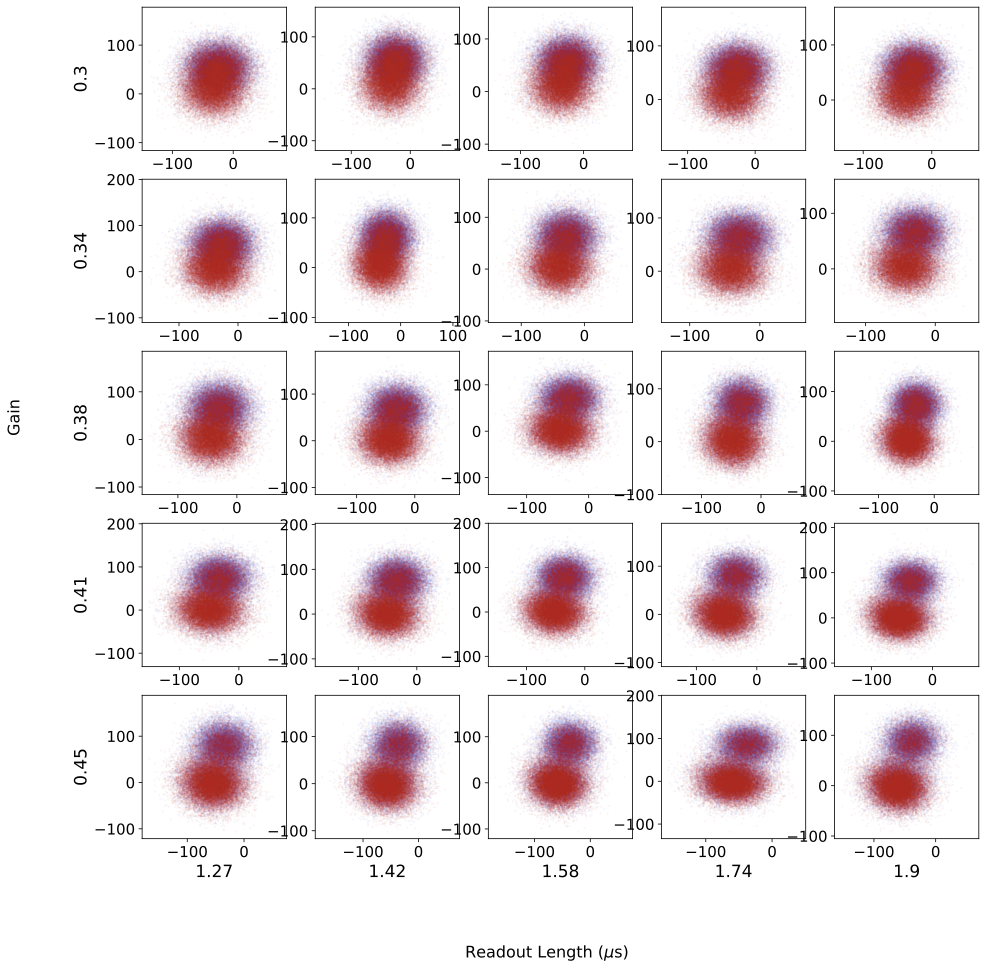

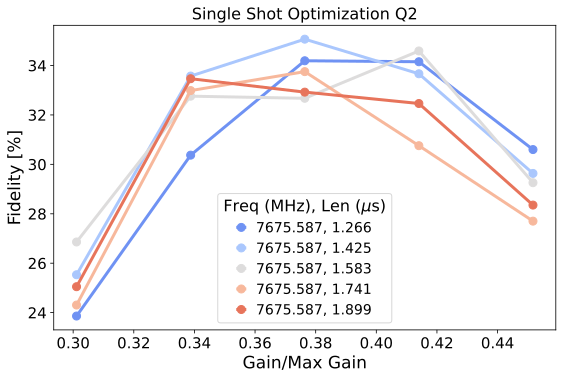

Max fidelity 35.066 %
Optimal params: 
 Freq (MHz) 7675.587 
 Gain (DAC units) 0.376 
 Readout length (us) 1.425
Set fidelity: 33.572 %
Set params: 
 Freq (MHz) 7675.587 
 Gain (DAC units) 0.339 
 Readout length (us) 1.425
*Set cfg device.readout 2 gain to 0.3388 from 0.3764*
*Set cfg device.readout 2 readout_length to 1.4246 from 1.5829*
*Set cfg device.readout 2 frequency to 7675.5872 from 7675.5872*


  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

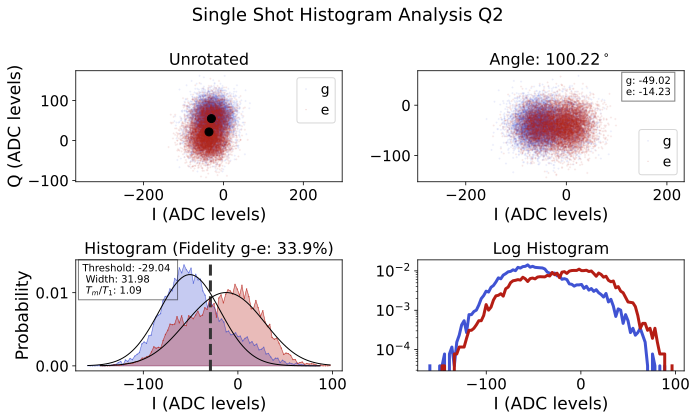

*Set cfg device.readout 2 phase to 100.2245 from 97.7312*
*Set cfg device.readout 2 threshold to -29.0396 from -32.6091*
*Set cfg device.readout 2 fidelity to 0.3394 from 0.3408*
*Set cfg device.readout 2 g_mean to -44.7399 from -41.4533*
*Set cfg device.readout 2 e_mean to -17.6589 from -12.7223*
*Set cfg device.readout 2 sigma to 31.9769 from 43.5081*
*Set cfg device.readout 2 tm to 1.0934 from -0.0216*
*Set cfg device.qubit 2 tuned_up to True from True*


In [ ]:
update=True
low_gain=True

qubit_list=np.arange(3)
qubit_list=[2]
params = {'expts_f':1, 'expts_gain':5, 'expts_len':5,'shots':30000}
#params = {'expts_f':12, 'expts_gain':1, 'expts_len':1}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    auto_cfg = rfboard.activate_qubit_rf(qi, soc, auto_cfg, cfg_file=cfg_path)

    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params, style='fine')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000})
    shot.update()

### Run optimization until it converges

Unexpected parameters found in params: {'step_f', 'step_len', 'step_gain'}


  0%|          | 0/5 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 291RuntimeWarning: invalid value encountered in multiply
 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 296OptimizeWarning: Covariance of the parameters could not be estimated
 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 926

Max fidelity 34.300 %
Optimal params: 
 Freq (MHz) 7675.415 
 Gain (DAC units) 0.418 
 Readout length (us) 1.439
Set fidelity: 34.300 %
Set params: 
 Freq (MHz) 7675.415 
 Gain (DAC units) 0.418 
 Readout length (us) 1.439


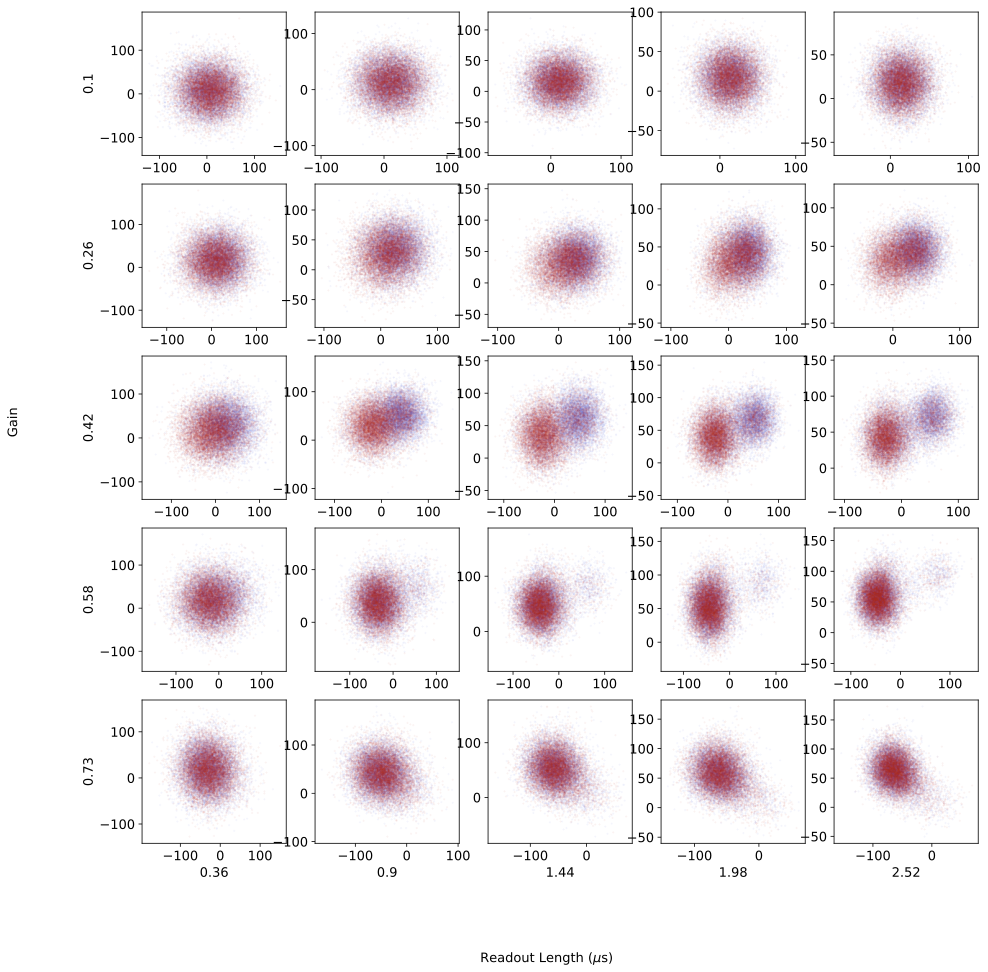

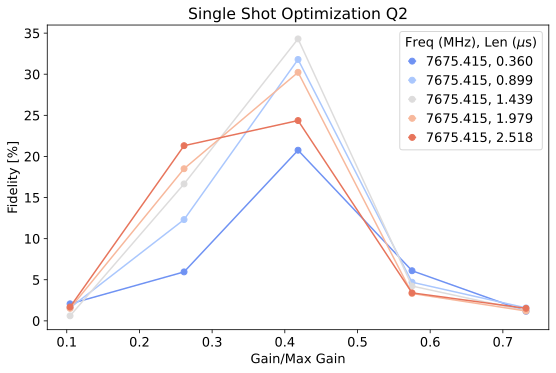

*Set cfg device.readout 2 gain to 0.4182 from 0.3485*
*Set cfg device.readout 2 readout_length to 1.439 from 1.1992*


  0%|          | 0/286000 [00:00<?, ?it/s]

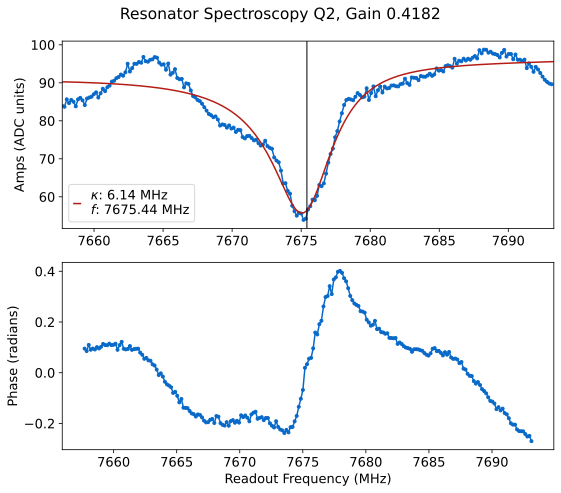

*Set cfg device.readout 2 frequency to 7675.1697 from 7675.4152*
*Set cfg device.readout 2 kappa to 6.1359 from 5.1087*
*Set cfg device.readout 2 qi to 0.2123 from 0.2299*
*Set cfg device.readout 2 qe to 0.3046 from 0.4338*
Unexpected parameters found in params: {'step_f', 'step_len', 'step_gain'}


  0%|          | 0/5 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 291RuntimeWarning: invalid value encountered in multiply
 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 296

Max fidelity 36.567 %
Optimal params: 
 Freq (MHz) 7675.170 
 Gain (DAC units) 0.376 
 Readout length (us) 1.439
Set fidelity: 36.567 %
Set params: 
 Freq (MHz) 7675.170 
 Gain (DAC units) 0.376 
 Readout length (us) 1.439


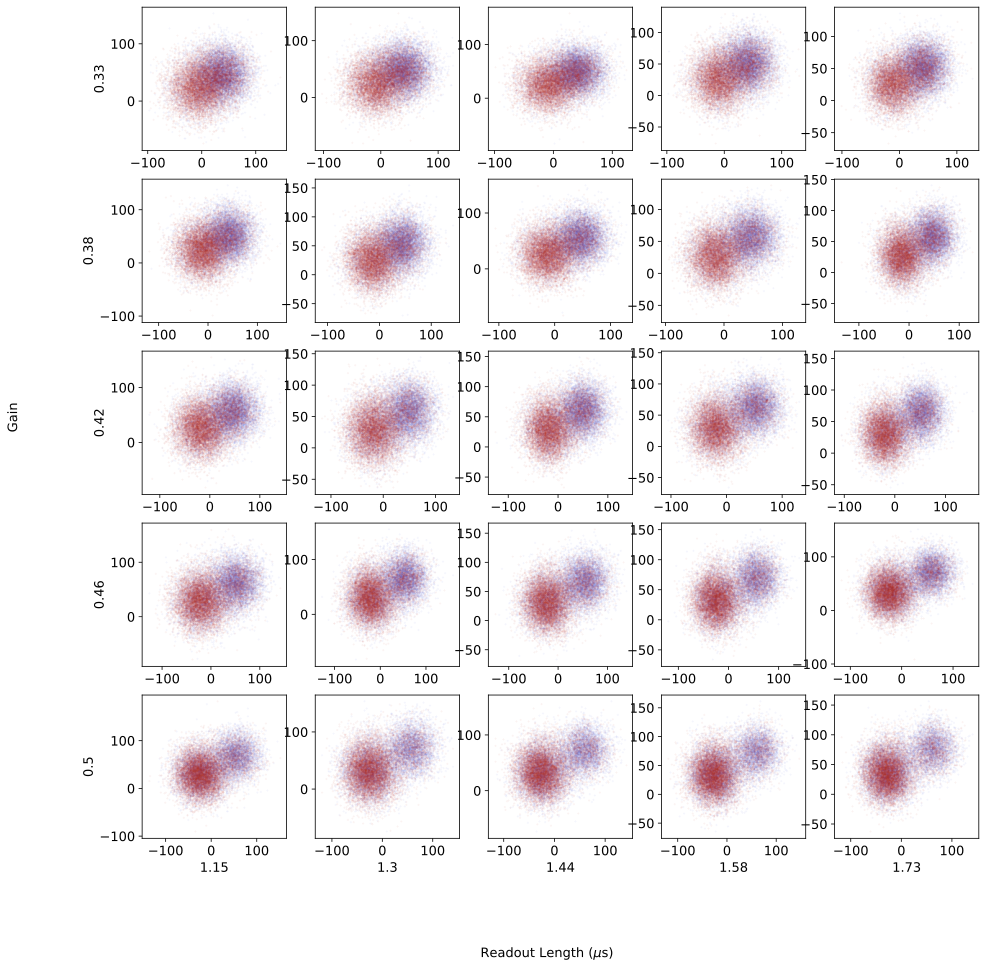

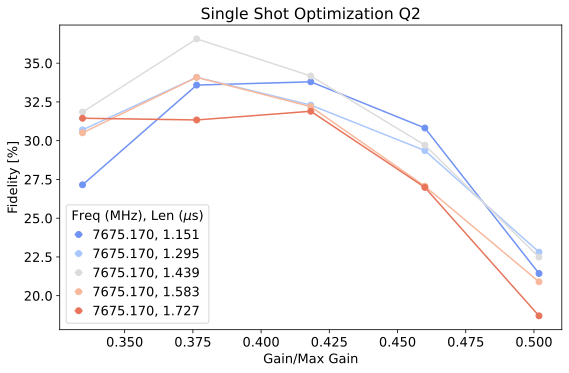

*Set cfg device.readout 2 gain to 0.3764 from 0.4182*
*Set cfg device.readout 2 readout_length to 1.439 from 1.439*


  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

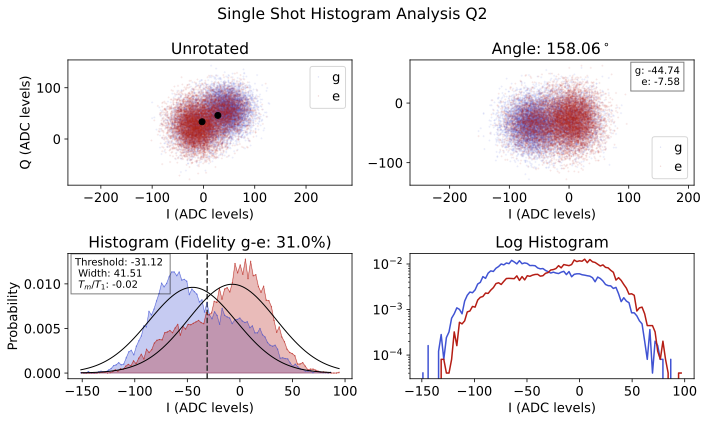

*Set cfg device.readout 2 phase to 158.0587 from 160.9395*
*Set cfg device.readout 2 threshold to -31.1191 from -26.0745*
*Set cfg device.readout 2 fidelity to 0.3097 from 0.3031*
*Set cfg device.readout 2 g_mean to -38.872 from -35.025*
*Set cfg device.readout 2 e_mean to -13.8161 from -11.1557*
*Set cfg device.readout 2 sigma to 41.5078 from 36.3615*
*Set cfg device.readout 2 tm to -0.019 from 0.4687*
*Set cfg device.qubit 2 tuned_up to True from True*


In [ ]:
qubit_list=np.arange(3)
qubit_list=[1]
params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

*Set cfg device.readout 2 trig_offset to 0.43 from 0.52*
*Set cfg device.readout 2 trig_offset to 0.4414 from 0.43*
*Set cfg device.readout 2 trig_offset to 0.4529 from 0.4414*
*Set cfg device.readout 2 trig_offset to 0.4643 from 0.4529*
*Set cfg device.readout 2 trig_offset to 0.4757 from 0.4643*
*Set cfg device.readout 2 trig_offset to 0.4871 from 0.4757*
*Set cfg device.readout 2 trig_offset to 0.4986 from 0.4871*
*Set cfg device.readout 2 trig_offset to 0.51 from 0.4986*
*Set cfg device.readout 2 trig_offset to 0.5214 from 0.51*
*Set cfg device.readout 2 trig_offset to 0.5329 from 0.5214*
*Set cfg device.readout 2 trig_offset to 0.5443 from 0.5329*
*Set cfg device.readout 2 trig_offset to 0.5557 from 0.5443*
*Set cfg device.readout 2 trig_offset to 0.5671 from 0.5557*
*Set cfg device.readout 2 trig_offset to 0.5786 from 0.5671*
*Set cfg device.readout 2 trig_offset to 0.59 from 0.5786*


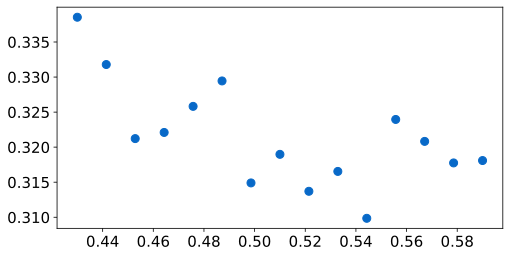

In [42]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[2]
trig_list = np.linspace(0.43,0.59,15)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':100000, 'trigger':trig}, progress=False, display=False)
        fids.append(float(shot.data['fids'][0]))

plt.figure()
plt.plot(trig_list, fids,'o')

*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.17 from 0.23*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.1764 from 0.17*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.1829 from 0.1764*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.1893 from 0.1829*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.1957 from 0.1893*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2021 from 0.1957*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2086 from 0.2021*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.215 from 0.2086*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2214 from 0.215*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2279 from 0.2214*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2343 from 0.2279*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2407 from 0.2343*
*Set cfg device.qubit 2 ('pulses', 'pi_ge', 'gain') to 0.2471 from 0.2407*
*Set cfg device.qubit 2 ('pulses'

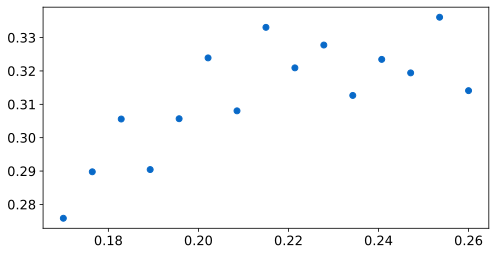

In [16]:
# Single shot 
qubit_list =[2]
gain = np.linspace(0.17,0.26,15)
fids =[]
for qi in qubit_list:
    for g in gain: 
        config.update_qubit(cfg_path, ("pulses", "pi_ge", "gain"), g, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':100000}, progress=False, display=False)
        fids.append(float(shot.data['fids'][0]))

plt.figure()
plt.plot(gain, fids,'o')

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

# Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

## Don't do reset, but measure repeatedly 

In [ ]:
qi=1
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'remeas':True, 'shots':40000})
shot.check_reset()

## Plot fidelity vs v threshold for active reset

In [ ]:
qi=1
rng=6
npts = 31
fids = []

auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,npts)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'threshold_v':t, 'active_reset':True,'setup_reset':False, 'reset':3}, display=False, progress=False)
    fids.append(float(shot.data['fids'][0]))
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')

from pathlib import Path

fig = plt.figure()
plt.plot(thresh, fids, 'o-')
plt.xlabel('Threshold (mV)')
plt.ylabel('Fidelity')
plt.axvline(threshold, color='r', linestyle='--', label=f'Threshold = {threshold:.2f}')
plt.legend()
file_path = Path(shot.fname)
new_filename = file_path.name.rsplit(".", 1)[0] + "_fidelity_reset.png"
fig.savefig(file_path.parent / "images" / new_filename)

##  Single shot experiment using active reset

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000, 'active_reset':True,'setup_reset':True,'reset':1})


## Test single shot

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False})


In [ ]:
fidelity=[]
final=[1, 3, 5, 7, 10]


qi=0
for f in final:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'active_reset':True,'final_delay':f, 'reset':1}, display=False)   

    fidelity.append(shot.data['fids'][0])

In [ ]:
fidelity


In [ ]:
fidelity


In [ ]:
qi=2
amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':True})
amp_rabi2 = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgi'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgi'])

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgq'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgq'])


In [ ]:
t1 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':True})
#t12 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t1.data['xpts'], t1.data['avgi'], label='Active Reset')
plt.plot(t12.data['xpts'], t12.data['avgi'])
plt.legend()
# plt.figure()
# plt.plot(t1.data['xpts'], t1.data['avgq'])
# plt.plot(t12.data['xpts'], t12.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})
#t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='Active Reset')
plt.plot(t22.data['xpts'], t22.data['avgi'])
plt.legend()
# plt.figure()
# plt.plot(t2.data['xpts'], t2.data['avgq'])
# plt.plot(t22.data['xpts'], t22.data['avgq'])

# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True, 'experiment_type':'echo'})
t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False, 'experiment_type':'echo'})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'])
plt.plot(t22.data['xpts'], t22.data['avgi'])

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgq'])
plt.plot(t22.data['xpts'], t22.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='active reset')
plt.plot(t22.data['xpts'], t22.data['avgi'], label='Normal')
plt.legend()
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])

# change the hist to take the first measurement 
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(amp_rabi.data['bin_centers'], amp_rabi.data['hist'])
plt.plot(amp_rabi2.data['bin_centers'], amp_rabi2.data['hist'])

## Sweep threshold

In [ ]:
d = []
qi=0
rng=25
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,16)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')
    #shot.check_reset()
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

In [ ]:
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

## Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

## Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

## Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(3)
qubit_list =[0]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

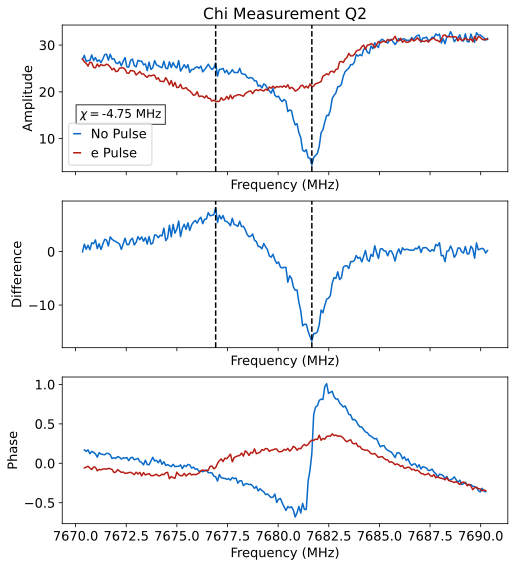

*Set cfg device.readout 2 chi to -4.7485 from -4.4517*


In [22]:
# Need a tuned up pi pulse for this
span = 20
qubit_list = [2]
for qi in qubit_list: 
    #chi, chi_val=measure_func.check_chi(cfg_dict, qi)
    chi, chi_val=measure_func.check_chi(cfg_dict, qi, span=span)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [ ]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -123
#qubit_list = np.arange(3)
qubit_list = [1]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

## Spectroscopy EF

### General search

In [ ]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[1]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

Unexpected parameters found in params: {'pulse_length'}


  0%|          | 0/4000000 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\calib\readout_helpers.py: 1139

R2:0.620	Fit par error:0.051	 Best fit:b'avgi'


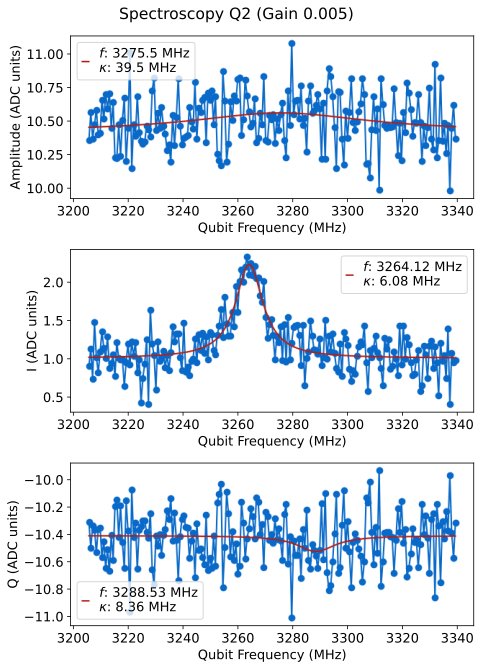

*Set cfg device.qubit 2 f_ef to 3264.1232 from 3264.6261*


In [31]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=True

qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    # set up filter and attenuation  
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':500,'gain':0.2})
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':False,'reps':20000,'gain':0.005, 'span':135, 'pulse_length':1,'start':3205})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

### Power sweep

  0%|          | 0/20 [00:00<?, ?it/s]

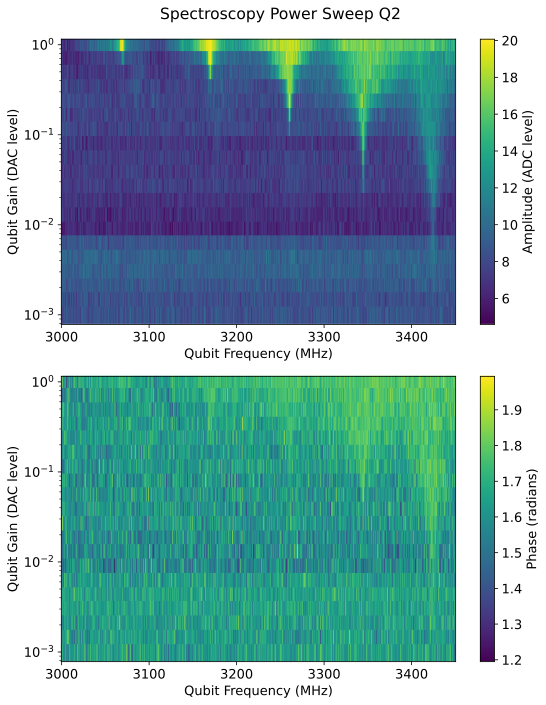

In [22]:
qubit_list = [2]

d = []
for qi in qubit_list:
    
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='medium', params={'length':1,'checkEF':False,'span':450,'start':3000,'rng':1000,'expts_gain':20,'expts':600})
    d.append(qspec_pow)

## Rabi EF

*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'sigma') to 0.01 from 0.01*
*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'gain') to 0.3154 from 0.089*


  0%|          | 0/60000 [00:00<?, ?it/s]

R2:0.552	Fit par error:0.085	 Best fit:b'avgi'


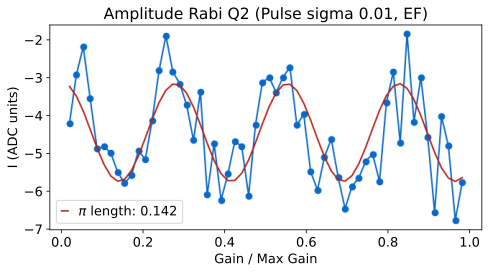

*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'gain') to 0.142 from 0.3154*


In [21]:
# If first time, initialize the sigma and gain to those of the ge 
first_time = True
update = True

qubit_list = np.arange(3)
qubit_list=[2]

bad_qubits = []
auto_cfg = config.load(cfg_path)
    
for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True, 'reps':1000, 'max_gain':1})#, disp_kwargs={'show_hist':True})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

    # MAX GAIN IS GOING TO 5 

  0%|          | 0/70 [00:00<?, ?it/s]

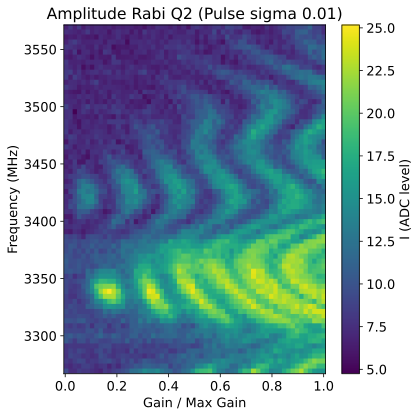

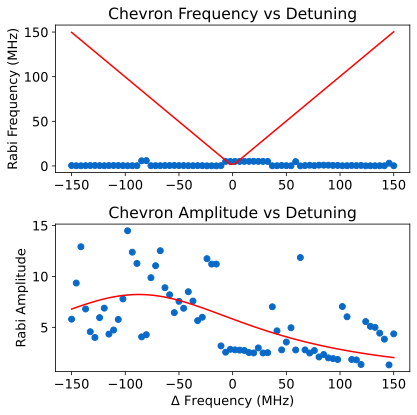

In [ ]:
amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':300, 'expts_f':70, 'reps':1200,'max_gain':1,'checkEF':False})#, live_plot=True)

## Qubit Temperature

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
# Setting number of rounds multiplies the default number of rounds by that number, so can be greater than or less than 1. 
# Make sure to run single shot first 
for qi in qubit_list: 
    # rounds will make scan take longer, needed for lower temperatures. 
    temp, pop = measure_func.measure_temp(cfg_dict, qi=qi, temp=50)# , rounds=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and EJ

In [ ]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(1):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

## Ramsey EF

In [ ]:
update=True
qubit_list=np.arange(3)
qubit_list=[0]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'checkEF':True, 'span':40, 'expts':100})#, disp_kwargs={'show_hist':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

# Calculate qubit params

In [ ]:
# If this is the first time you're doing this, create new file 

qubit_params.ham(cfg_path)
qubit_params.delta(cfg_path)
qubit_params.cohere(cfg_path)

# Stark

## Ramsey

### Single experiment

In [ ]:
qi=0
t2_stark = meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':1,'df':40,'acStark':True,'ramsey_freq':0.1, 'expts':100})

### Create stark part of config file for tracking Gain-> Freq
Only do once for each config

In [ ]:
# config.init_stark_section(cfg_dict['cfg_file'], 6)

### Sweep frequency

In [ ]:
qubit_list = np.arange(3)
qubit_list=[3]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

### Calibrate stark power positive freq

You'll want to adjust the step size / expts to capture the full frequency range 

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
d=[]
freqs= [50]
update=True
for f in freqs:
    for qi in qubit_list:
        params={'step':0.015, 'expts_gain':16, 'df':f, 'start_gain':0.035, 'end_gain':0.16,'expts':140, 'ramsey_freq':0.1}
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
        d.append(t2rstark)
        if update: t2rstark.update(neg=False)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

In [ ]:
#qubit_list = np.arange(3)
update=True 
qubit_list=[0]
df = -45
for qi in qubit_list:
    params = {'step':0.015, 'expts_gain':12, 'df':df, 'start_gain':0.04, 'end_gain':0.11, 'expts':140}
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params)#, live_plot=True)
    if update: t2rstark.update(neg=True)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

## T1

### Single exp

In [ ]:
qi=1
gain_list = [2]
for g in gain_list:
    params = {'stark_gain':g,'df':40,'expts':60, 'span':106}
    #params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':10,'span':0,'reps':1000}
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params=params) 

### Gain sweep

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]

flist=[-45]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'rounds':4})
        params={'df':f,'start_gain':0,'end_gain':0.14,'start':0.2, 'rounds':1,'span':103,'expts_gain':20, 'expts':80}
        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params=params)#, live_plot=True) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

### Single evo point linear gain sweep

In [ ]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':100})

### Sweep frequency linearly, 1d scan

In [ ]:
t1_quad = meas.T1StarkPowerQuadSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':300, "stop_f":3})

# It would be good to add a few excited state and ground state measurements to this. 

In [ ]:
t1_norm = -1/np.log((t1_quad_2d.data['scale_data']-shot.data['g_norm'])/shot.data['e_norm'])*tau/auto_cfg.device.qubit.T1[qi]

### Sweep frequency linearly, 2d scan sweep over time

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':2})
t1 = meas.T1Experiment(cfg_dict, qi=qi)

In [ ]:
print(shot.data['g_norm'])
print(shot.data['e_norm'])

In [ ]:
print(shot.data['vg'])
print(shot.data['ve'])

### Corrected 2D scan

In [ ]:
qi = 0

#params={'wait_time':tau, "stop_f":6, 'expts':200, "sweep_pts":10, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm']}

for i in range(1):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':2})
    #shot.update()
    t1 = meas.T1Experiment(cfg_dict, qi=qi)
    t1.update()
    if t1.data['new_t1']>103:
        tau = 103
    else:
        tau = t1.data['new_t1']
    #params={"wait_time":tau, "stop_f":6, 'expts':300, "sweep_pts":15, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm'], 'vg':shot.data['vg'], 've':shot.data['ve']}
    params={"wait_time":tau, "df":6, 'expts':300, "sweep_pts":15, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm'], 'vg':shot.data['vg'], 've':shot.data['ve']}

    t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi,params=params)# , live_plot=True)

In [ ]:
t1_quad_2d.data['stark_gain_pts'][0]

In [ ]:
t1_quad_2d.cfg.expt.wait_time

In [ ]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    #plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])
    plt.plot(t1_quad_2d.data['f_pts'][i], t1_quad_2d.data['t1_norm'][i])#+0.43*i)

In [ ]:
self.data['t1_norm'] = -1/np.log((self.data['scale_data']-self.cfg.expt['g_norm'])/self.cfg.expt['e_norm'])*self.cfg.expt.wait_time/self.cfg.device.qubit.T1[q]


In [ ]:
qi=0

tau=104
t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi, params={'wait_time':tau, "stop_f":3.5, 'expts':10, "sweep_pts":100}, live_plot=True)

In [ ]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])

In [ ]:
plt.figure()
plt.imshow(t1_norm, aspect='auto', origin='lower')
plt.colorbar(label='avgi')
plt.xlabel('Sweep Points')
plt.ylabel('Wait Time Index')

In [ ]:
len(t1_quad_2d.data['xpts'])

In [ ]:
t1_quad_2d.data['xpts']

In [ ]:
t1_quad_2d.display()